<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/15.Noisy5_20_dim_user_case_BOGP_p%3D40.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 40 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [ ]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

In [ ]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

In [5]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [8]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [9]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [10]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  if iteration<180:
   beta = 5*np.exp(((-1)*(10+np.log(5))*iteration)/(180*0.43))
  else:
   beta = 0.0000000001
  
  for i in range(5):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [11]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_noisy_5.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_noisy_5.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_5.npy")

x_next is [-18.61800055  37.15871564  23.23234403 -24.15973354  21.36598947
 -21.70416687  -0.06423255  33.75934711  11.53669254  23.29584298
   1.46603028 -25.05308631 -18.40708469 -23.43783277 -11.39234373
  22.62524894 -24.84882083  17.85866673   4.23483655  24.66015232]
f()=0.000000, actual=28.126
0


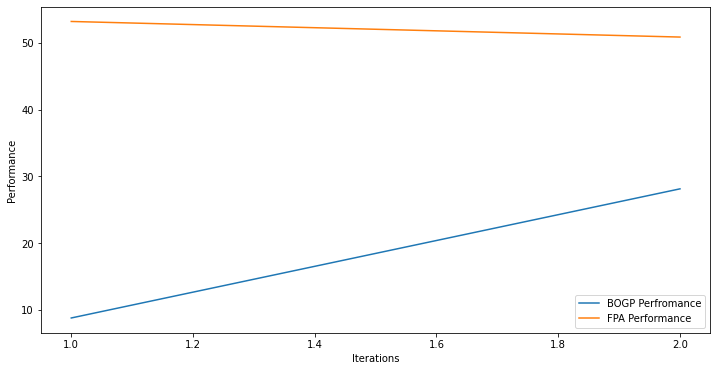

x_next is [-24.87998337  27.94086597  26.5238434    4.95202502 -30.6825714
 -27.82777074   1.06387489   9.75090283 -27.86574368  19.5830086
 -20.85085906 -15.89329403  30.51087362 -18.21553129   9.90624696
  30.21711864  35.84218026 -29.09953039  33.91315673 -15.25376536]
f()=13.370031, actual=34.385
1


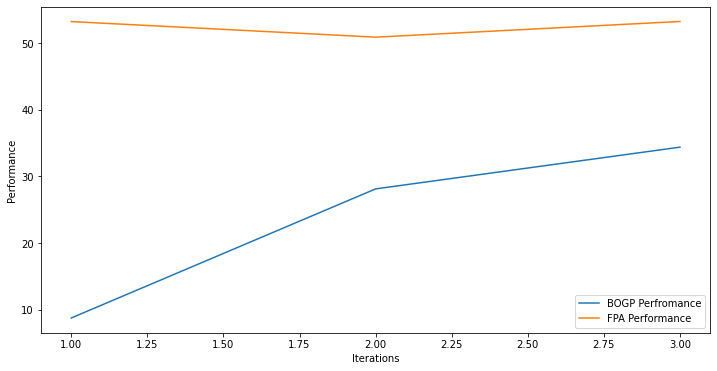

x_next is [ 39.66705841  39.98988436  39.9342988   39.51992294 -30.66621128
  39.65291596  39.91470411  39.29777044 -30.70015791  39.95862855
  39.43248939  39.98735264  39.36273447  39.95566414  39.96829777
  39.87610534  39.94934405 -30.7284026   39.9398058  -30.85718061]
f()=21.258264, actual=43.835
2


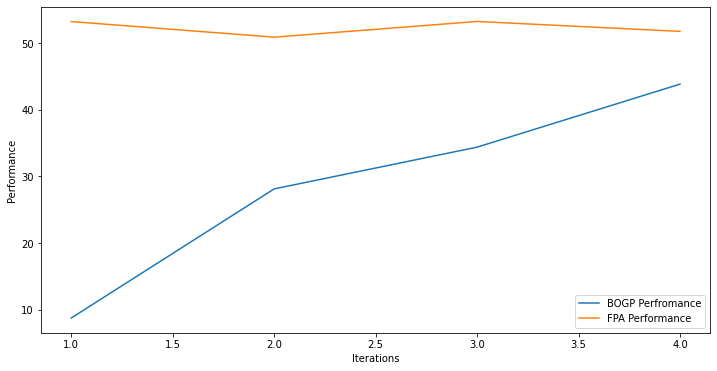

x_next is [ 31.21310244 -27.6539591   38.5068031  -19.02120024 -20.64664945
   8.0496335   20.76697573 -13.55699737  18.47838461 -29.39980815
  24.3243716    3.32121264 -14.53196925   7.50176242 -23.37175658
  33.09263799 -12.92795837  -8.98473116  35.56192775  11.75809672]
f()=26.870800, actual=31.996
3


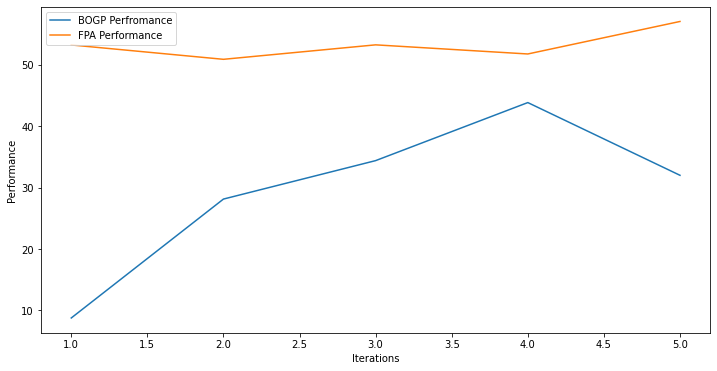

x_next is [ 20.2785378    3.26979639  -5.47632554  20.29387879 -25.35151465
  27.76526121   5.1983269   36.59324338   6.91829357  28.48833318
  -0.85070125 -18.87358332 -11.87388288  23.98439547   2.59215292
 -11.57881869 -22.79626212 -12.25744112  33.922177   -25.9092543 ]
f()=28.288406, actual=28.850
4


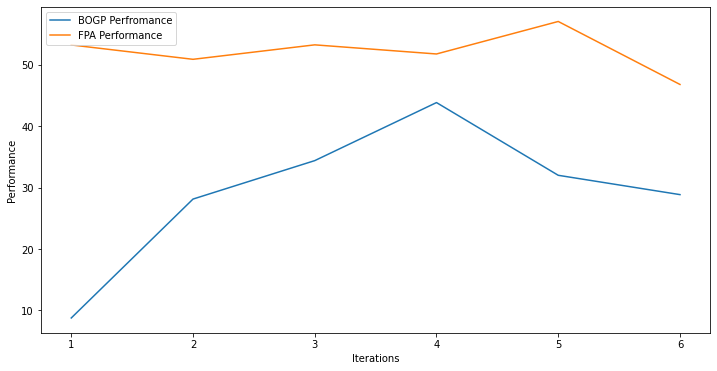

x_next is [-24.73232737  29.13886681  -5.1902992   -1.64586332   1.56617065
 -20.36525507 -30.22318073  19.25085837   6.14659289  18.33590473
 -30.82470901 -20.54170227  26.80980988 -24.60427941 -13.25590606
 -13.50592223  10.08488007  17.71247794 -22.06997131  -2.81303489]
f()=28.568167, actual=20.030
5


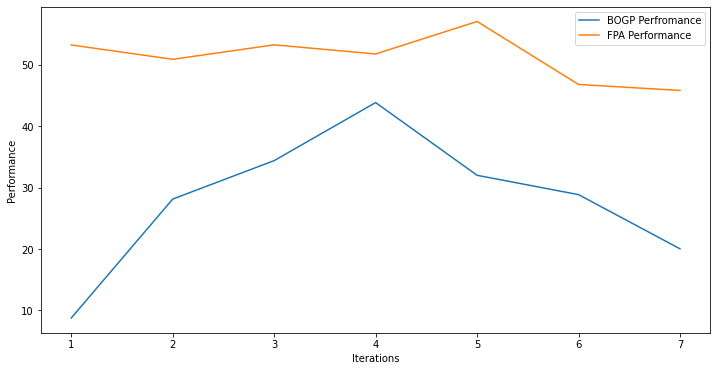

x_next is [ 37.62889511 -24.89122117  26.66154387 -17.24090263  -9.76253549
  29.35024251  39.81587936 -13.22270316  37.74975134 -30.13500141
  21.73444855  20.61013841  30.80386994  34.47139419  36.63305336
  14.89061752  19.87803438  -4.45594656  -6.40468084 -22.29794287]
f()=27.368030, actual=29.773
6


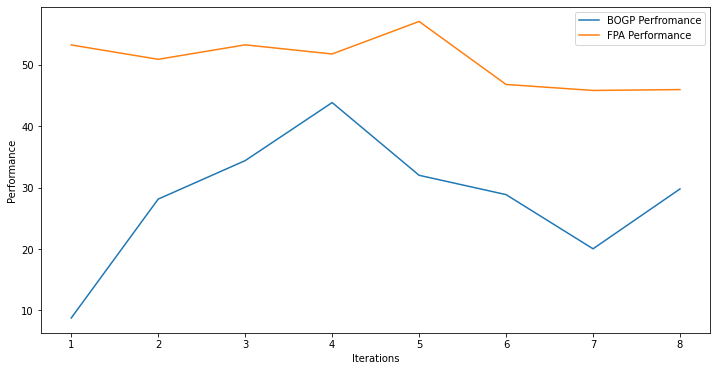

x_next is [-24.26871853 -18.7866024   24.59935379  23.88318798   2.19615003
  35.35616975  35.14887203  25.59325447 -17.11726943  12.31196658
 -26.81814476 -30.39827489   0.79866564   8.86320675 -24.66388617
  19.06394415   9.53904034  30.0945751   10.33048391  -5.67342719]
f()=27.749436, actual=31.432
7


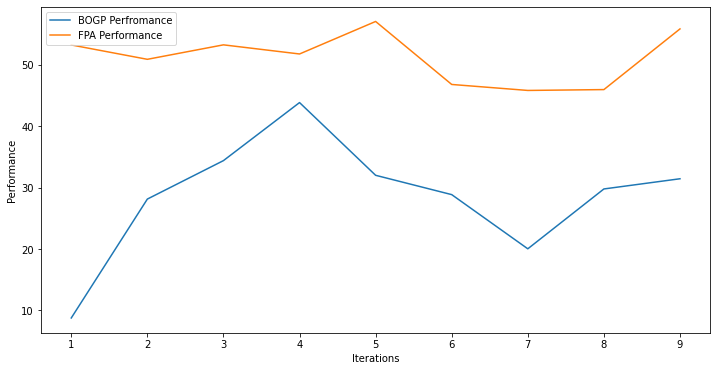

x_next is [ -0.62108777  36.23632184 -20.48008151  25.28500349 -11.76423919
  14.79271933  37.28906982  39.11800348  22.18851612   0.07440414
  -3.12551094 -10.34320566  -2.06227285  19.91575313 -22.67646608
  -3.84008419  39.00601996  16.76060273  29.98226923  -9.6110134 ]
f()=28.211103, actual=30.824
8


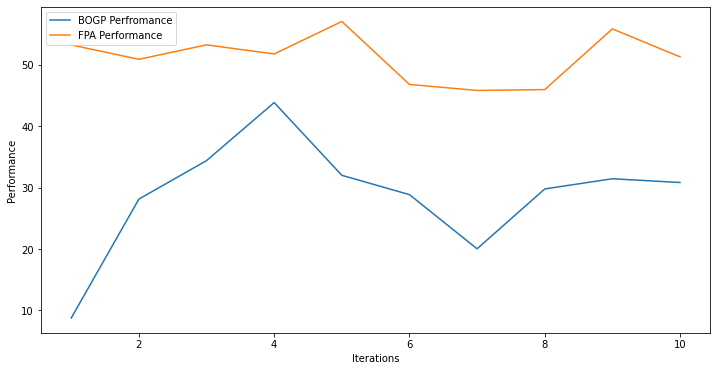

x_next is [-18.67210678  28.91155896 -21.99012603   3.96354849 -16.13983367
  18.63453155  37.804735    -4.01410338 -20.45712548  31.69214194
 -22.74136754  -7.74474902 -13.15441339   1.47005521 -25.72628031
   1.33667875   9.29820177  14.588443    34.13902491 -13.23810567]
f()=28.509571, actual=20.440
9


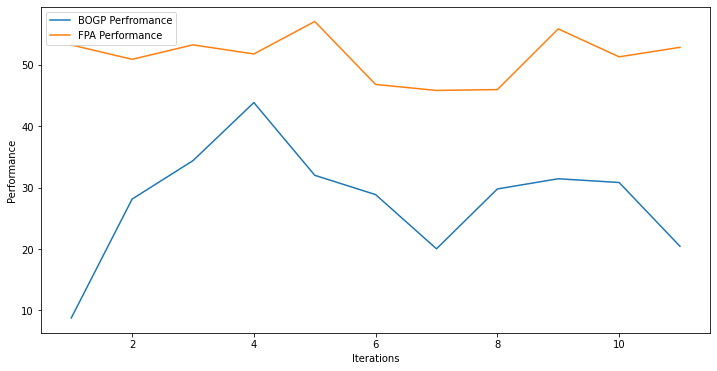

x_next is [ 39.99986348  39.99878361  39.99988434  39.9993999  -30.9996679
  39.99914345  39.99988371  39.99999451 -30.99936795  39.99992081
  39.99978359  39.99962544  39.99995802  39.99964738  39.99994536
  39.99959857  39.99967658 -30.99973453  39.9996701  -30.99940899]
f()=27.775464, actual=44.635
10


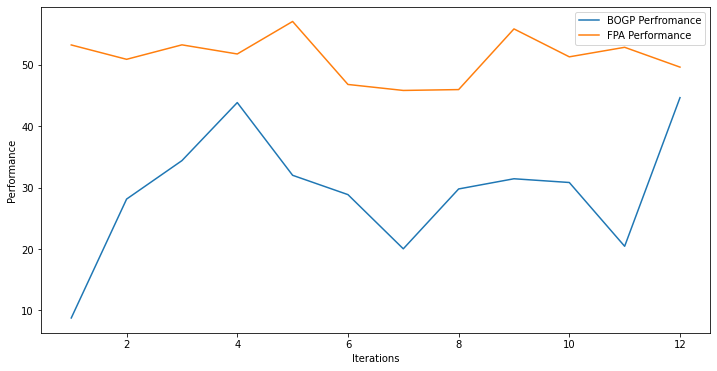

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=41.185345, actual=46.833
11


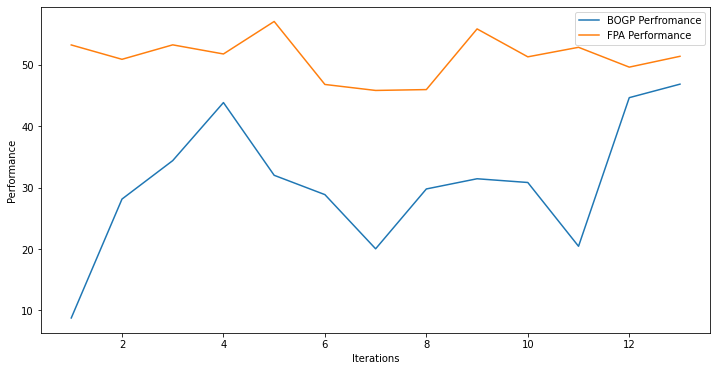

x_next is [ 40.          40.          40.          11.12338526 -31.
  40.          40.          40.          40.          40.
  23.35956438 -31.          40.          40.         -31.
  40.          40.         -31.          40.         -31.        ]
f()=50.266667, actual=38.857
12


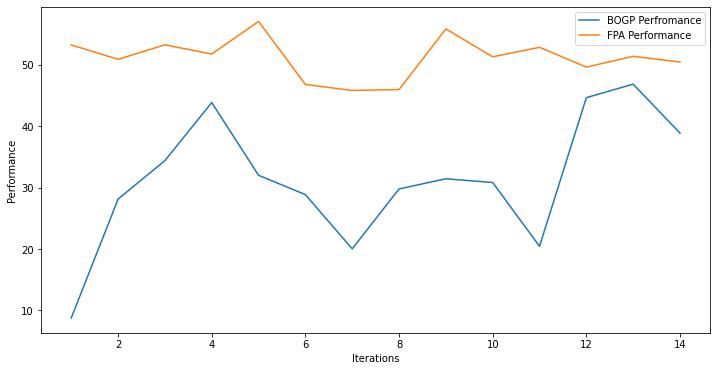

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=43.332364, actual=43.595
13


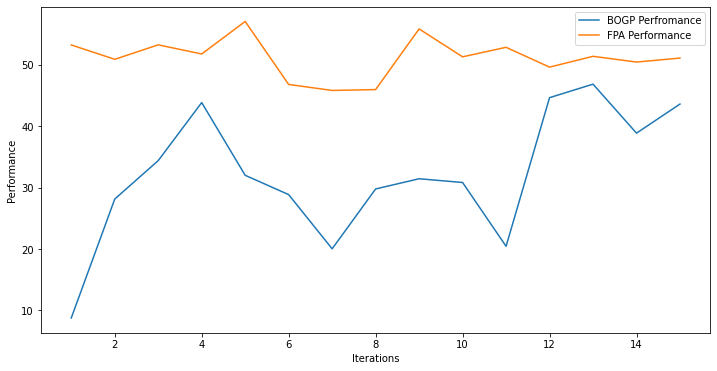

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=43.618807, actual=42.884
14


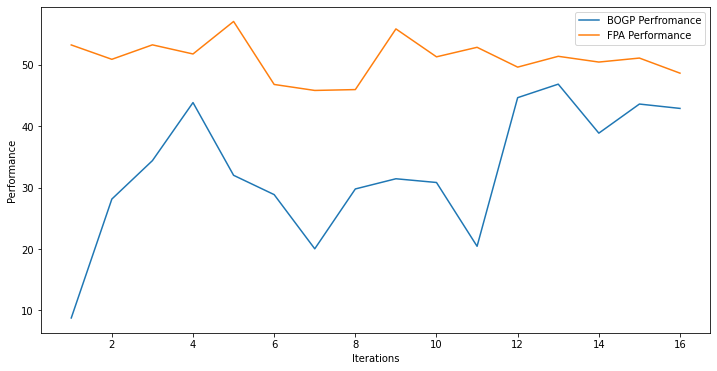

x_next is [ 24.24985262  40.          40.          40.         -31.
  35.87712881  40.          40.          -8.06455936   4.54226376
   3.23742051 -31.          40.          30.52549613  40.
  40.          40.          21.0963849   40.         -31.        ]
f()=44.279962, actual=38.886
15


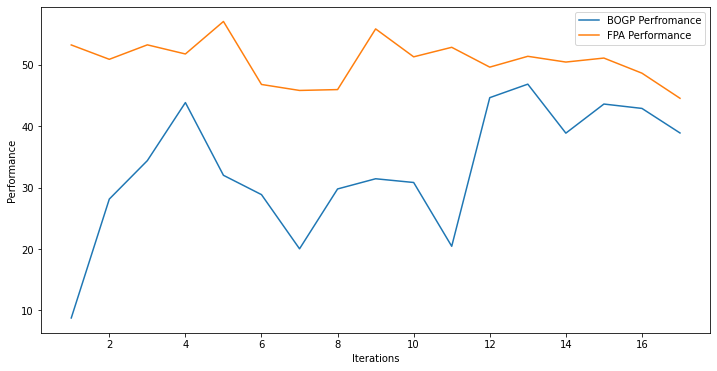

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=43.489585, actual=45.341
16


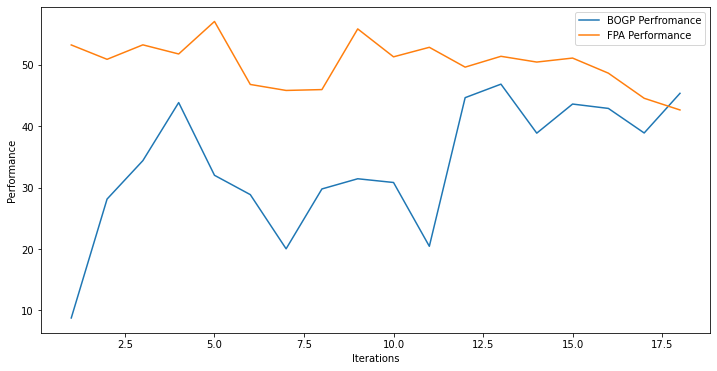

x_next is [ 39.5743079    1.54337118  40.          40.         -31.
  40.          40.          40.          -2.28305304  28.67802234
  40.          40.          40.          40.          27.00871005
  40.          40.         -31.          40.         -31.        ]
f()=44.110148, actual=49.376
17


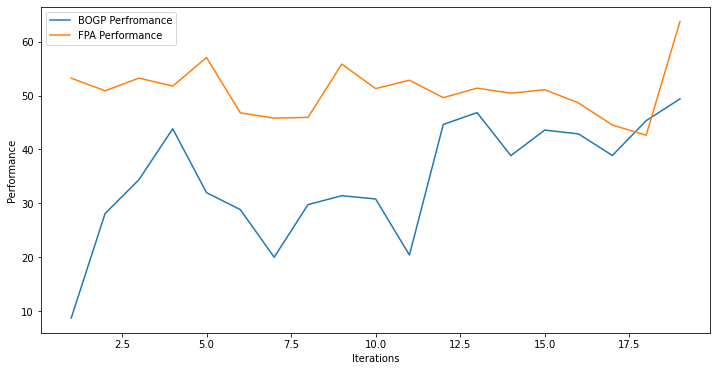

x_next is [ 40.         -31.          40.          40.         -31.
  40.          40.          40.          19.85039218  24.34385513
  40.          40.          40.          40.          23.54118838
  40.          40.         -31.          40.         -31.        ]
f()=49.692639, actual=41.925
18


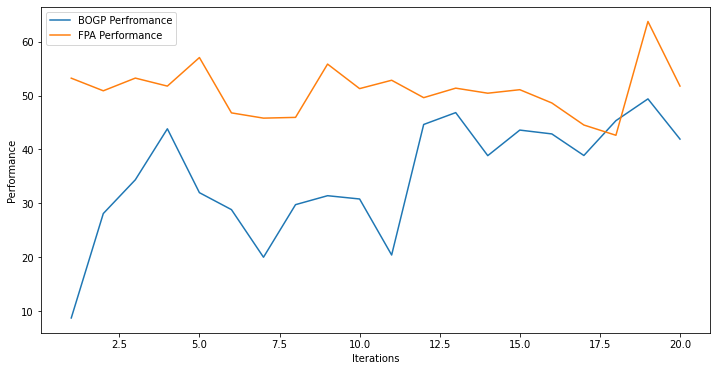

x_next is [ 37.07396218  13.26879015  40.          36.61479596 -31.
  40.          40.          40.          -7.57356972  18.64098588
  39.14701401  38.04131915  40.          39.90109731  15.36752556
  40.          38.59180283 -31.          40.         -31.        ]
f()=48.811428, actual=41.648
19


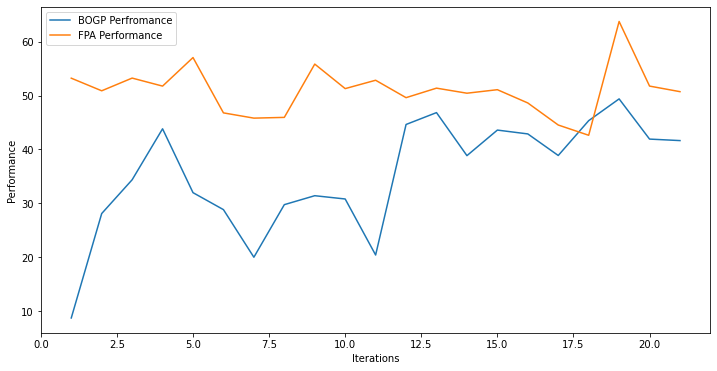

x_next is [ 40.          27.03223598  40.          40.         -31.
  40.          40.          40.         -25.82431227  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.315108, actual=47.574
20


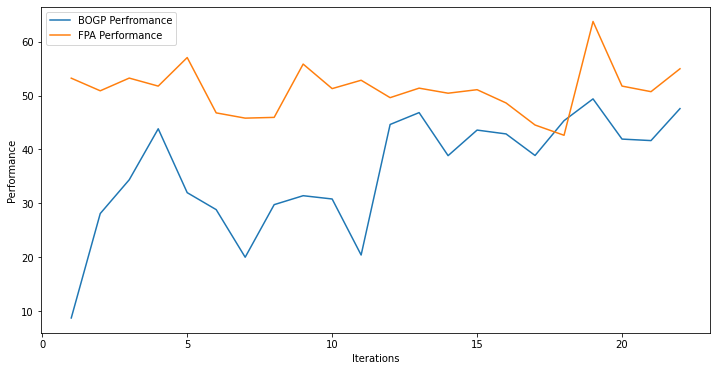

x_next is [ 40.           0.30989279  40.          40.         -31.
  37.18723126  40.          40.          -4.83490665  40.
  38.22552554  32.33740077  37.50134057  38.56701025  40.
  40.          40.         -30.3970454   40.         -28.40618031]
f()=49.775246, actual=40.938
21


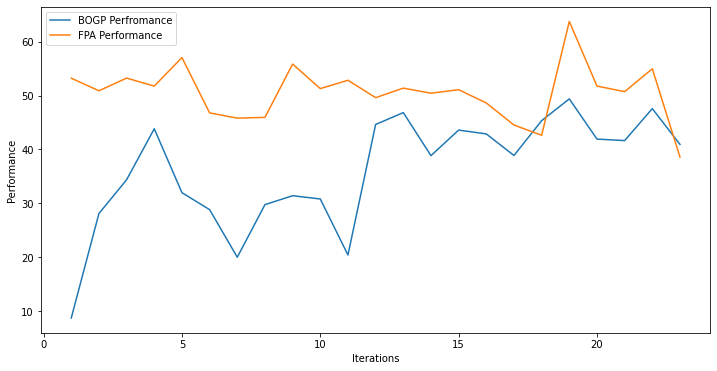

x_next is [-23.38913014 -12.5985081  -26.69223703  11.44832607  31.16478265
 -29.96574672  12.78188025  -7.9208237    1.62676349  35.31061158
   4.27356282  -9.92996167  -4.74876083  19.14415531  -4.65778668
   9.35331212  -6.10161659 -19.96453246  27.71530909  19.91685513]
f()=36.001279, actual=28.662
22


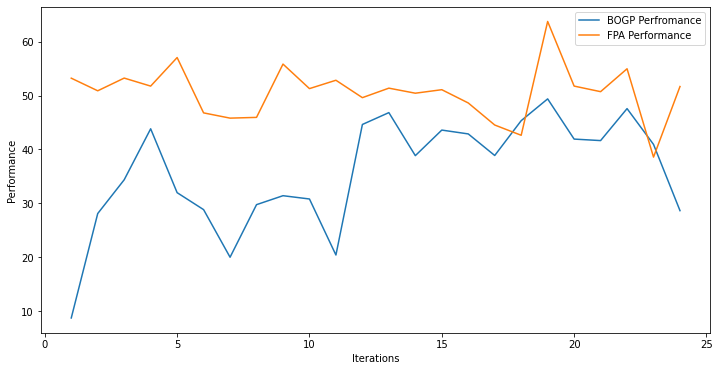

x_next is [ 40.          37.17661883  40.          40.         -31.
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -27.90373157]
f()=44.422529, actual=43.934
23


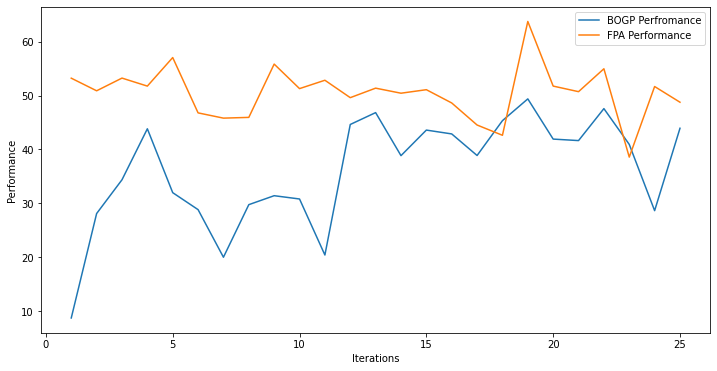

x_next is [ 40.          32.12216655  40.          40.         -31.
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -26.29785732]
f()=44.398900, actual=44.150
24


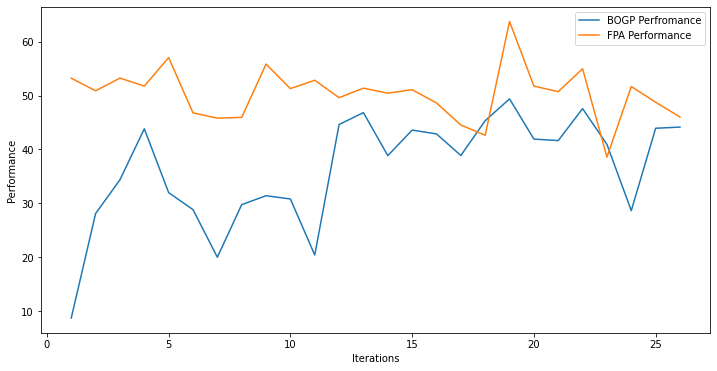

x_next is [ 40.          29.29256887  40.          40.         -31.
  32.2604647   40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -24.64484934]
f()=44.406902, actual=43.903
25


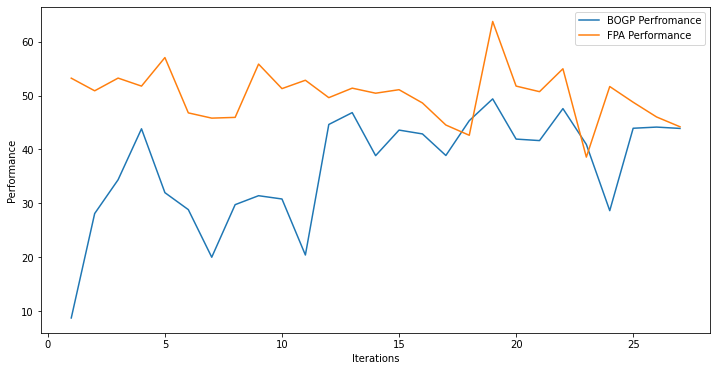

x_next is [ 40.          27.38021583  40.          40.         -31.
  28.89645799  40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -25.45703731]
f()=44.392371, actual=37.601
26


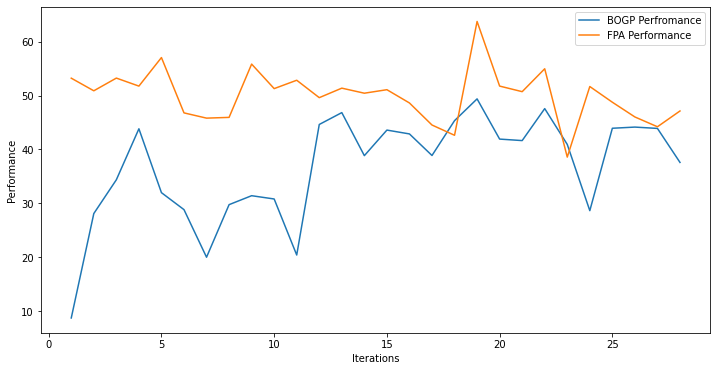

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -19.38338195  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=43.879230, actual=39.832
27


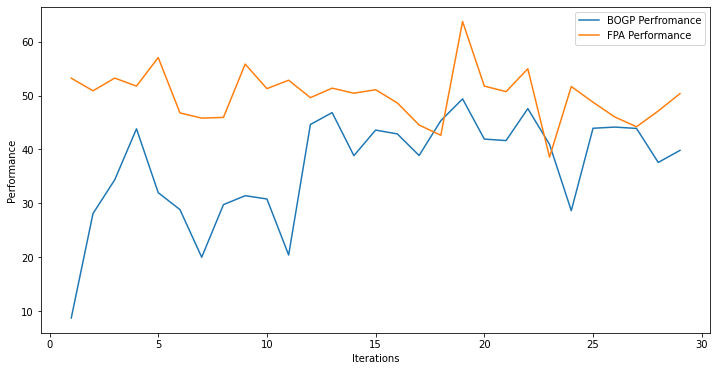

x_next is [ 40.          20.82630856  40.          40.         -31.
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=43.601497, actual=43.935
28


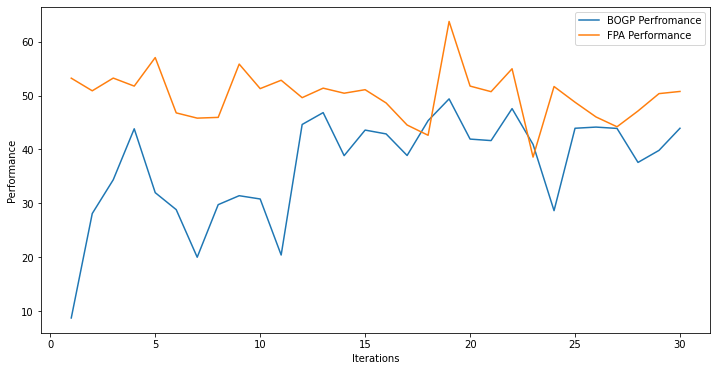

x_next is [ 40.          16.90241626  40.          40.         -31.
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=43.643923, actual=41.383
29


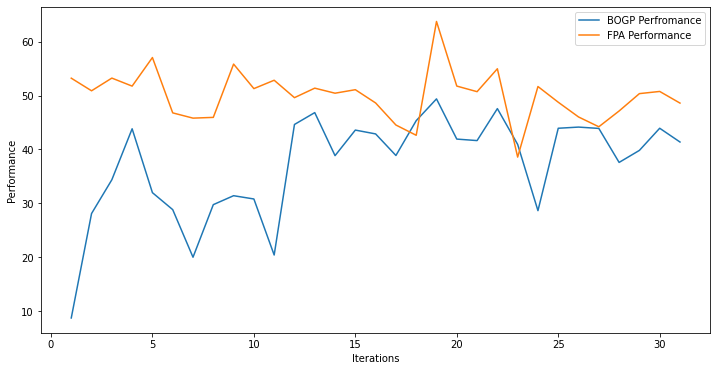

x_next is [ 40.          30.56877623  40.          40.         -31.
  40.          40.          40.         -22.54750461  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=43.496600, actual=59.568
30


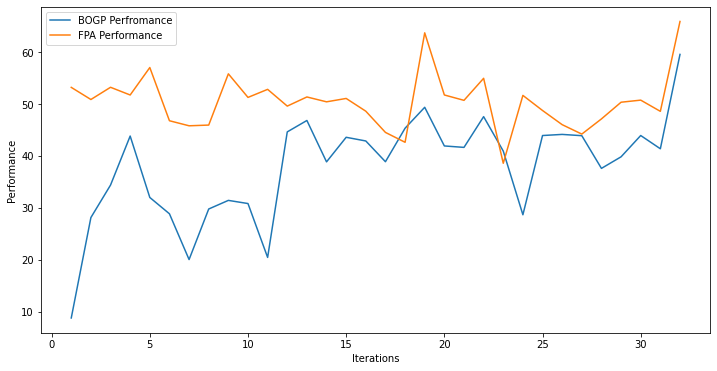

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.85969135  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.330963, actual=48.856
31


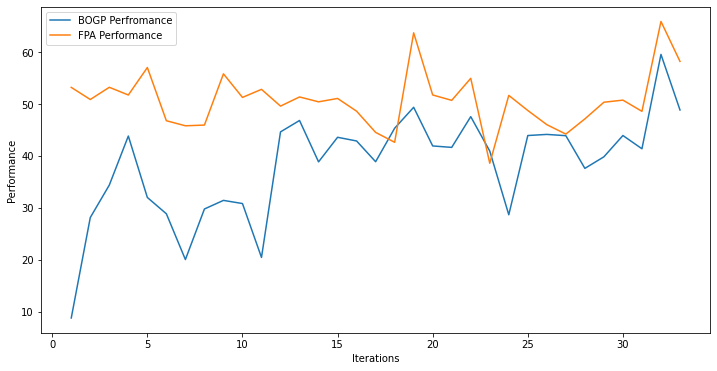

x_next is [ 39.97942695  39.83576505  39.95153509  39.91407905 -30.98411906
  39.99021148  39.90899941  39.98918376 -30.9909997   39.88951325
  39.97983738  39.98413349  39.97303697  39.91878068  39.97946106
  39.97114118  39.95230202 -30.97803393  39.97987143 -30.93734611]
f()=38.186002, actual=44.920
32


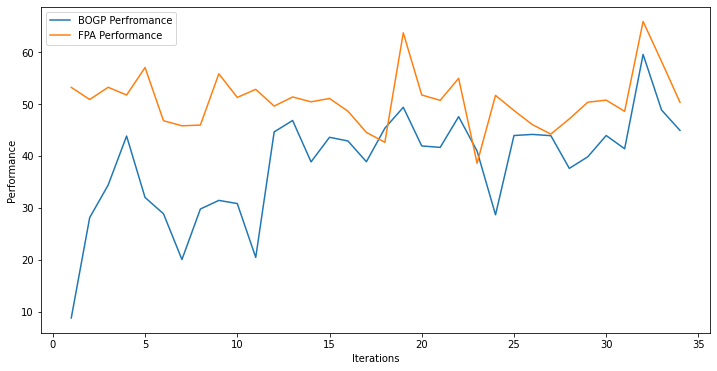

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.54084278  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.642618, actual=43.978
33


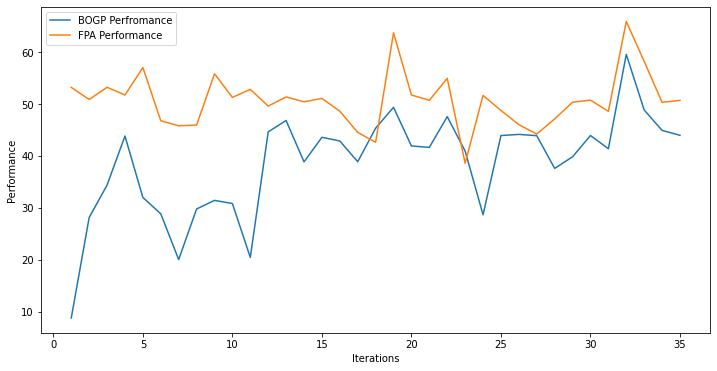

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -24.14199355  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.615250, actual=47.603
34


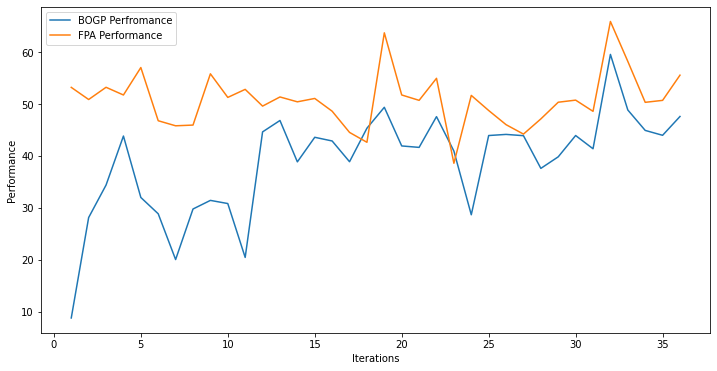

x_next is [-19.7583745  -22.89300217  30.59785531 -11.92330041 -20.38996473
  26.59814783 -16.64046693   4.29916817   2.09805353  36.29083878
  18.79162398   1.13016833  33.85752015  24.15478555  29.35205645
 -10.04768617 -16.47098562  15.12515525 -28.90645455   0.15394973]
f()=38.799776, actual=27.232
35


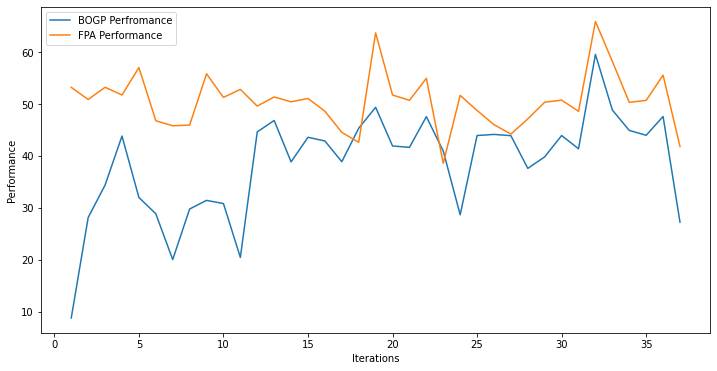

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -24.43316852  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.761843, actual=51.523
36


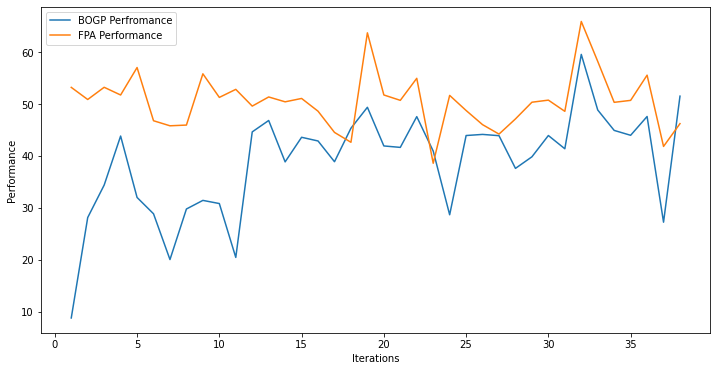

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -20.97245065  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.097027, actual=44.760
37


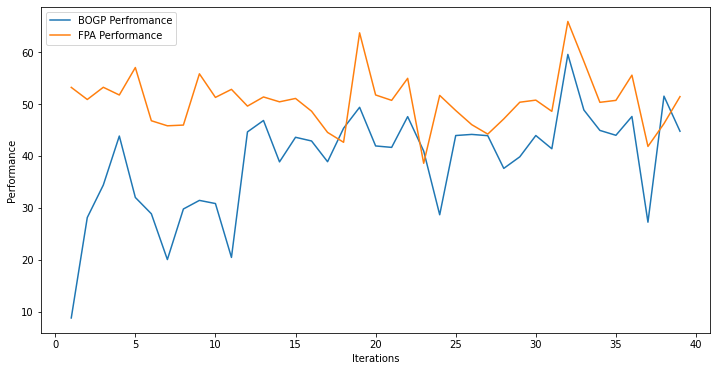

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -19.97598113  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.090573, actual=42.598
38


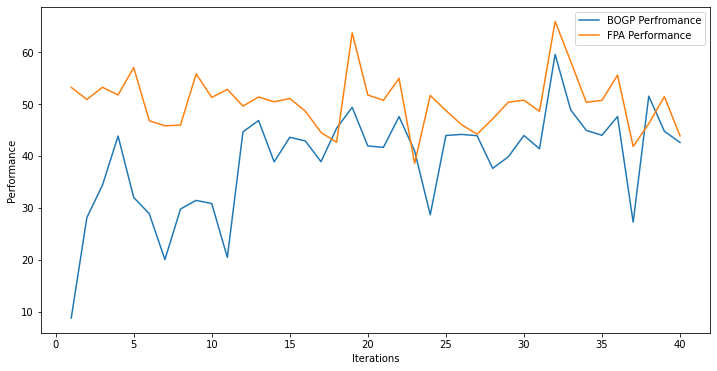

x_next is [ 39.99950316  39.99985624  39.99913678  39.9998684  -30.99989722
  39.99985488  39.99981639  39.99999217 -30.99897686  39.99983013
  39.99959912  39.99901423  39.99985456  39.99951434  39.99954031
  39.99970369  39.99993579 -30.99976052  39.9994658  -30.99987393]
f()=39.073750, actual=46.598
39


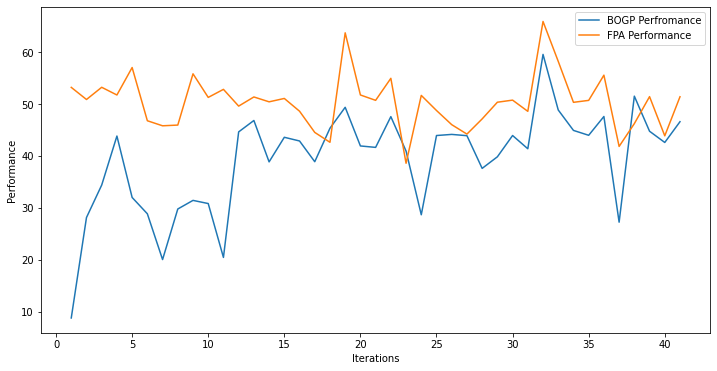

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.18133848  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.053003, actual=47.199
40


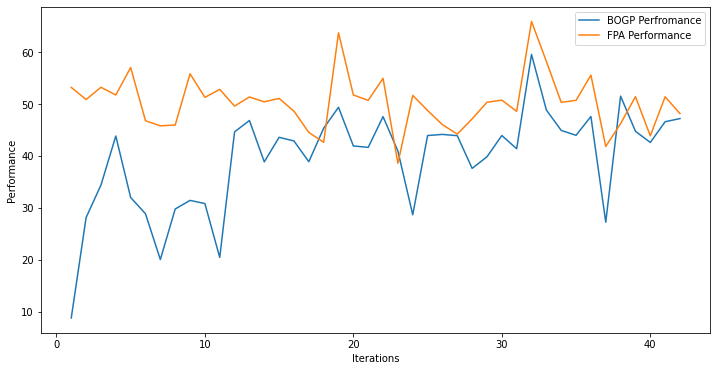

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -23.14673771  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.149742, actual=47.899
41


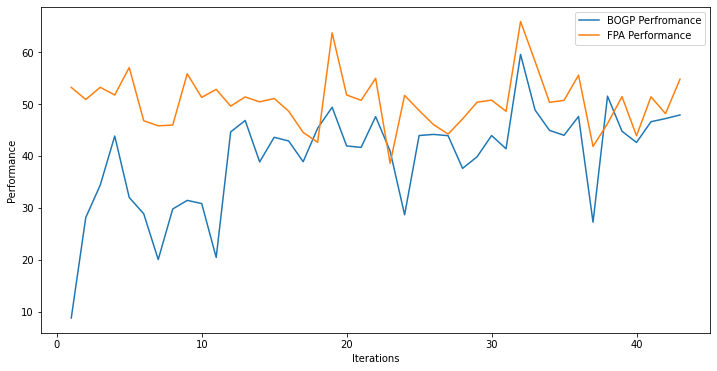

x_next is [-28.31368567   1.00231911  33.76400966  13.36805329  36.19631866
  24.29769642  34.91006234  35.58325331  22.53798631  17.75738113
 -16.03666819  11.29967664  13.28390597  30.96362841  14.97285779
  33.18221331 -12.38520886   9.49456392   4.16641417   9.3000299 ]
f()=38.083165, actual=34.925
42


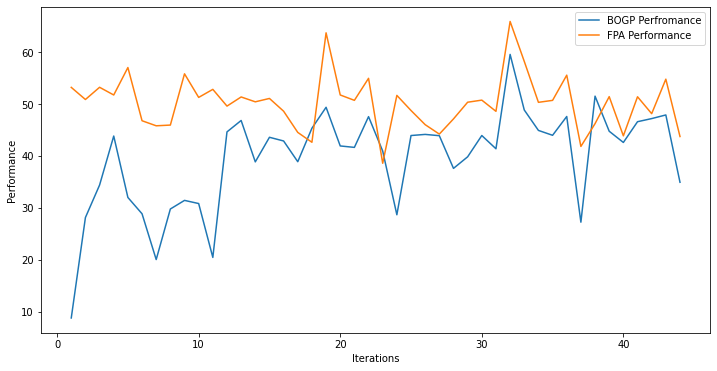

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.         -7.8373186  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.321710, actual=41.083
43


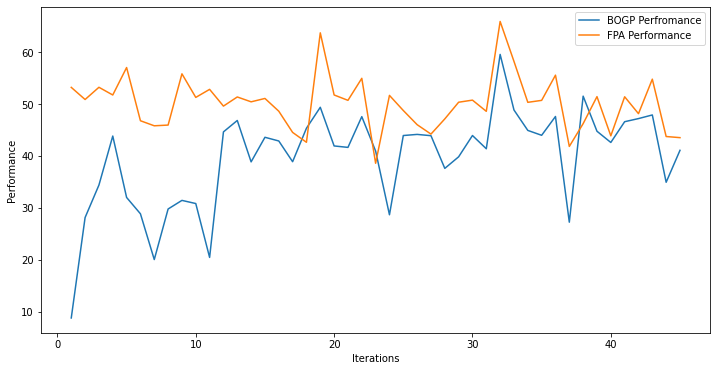

x_next is [-31.          40.          40.          40.         -31.
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.           2.97595787]
f()=45.240958, actual=40.625
44


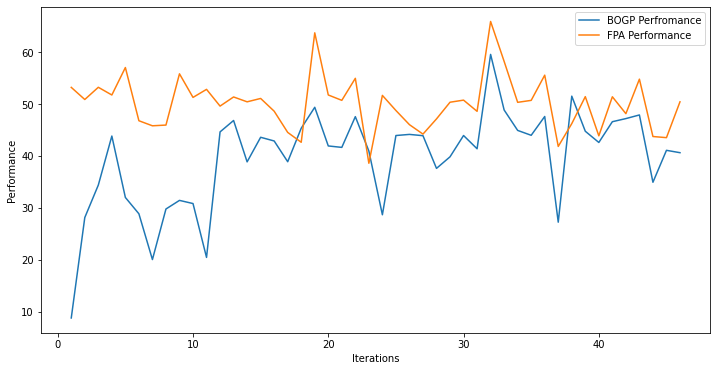

x_next is [ 40.          40.          40.          40.         -27.82025098
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.040285, actual=43.303
45


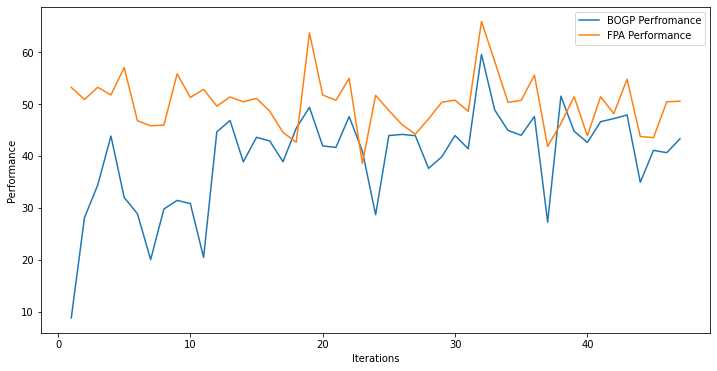

x_next is [ 36.63093226  37.89494     30.95640639  38.52221968 -23.38605486
  36.59946559   2.61886763   7.72156496  16.41842055 -10.67728111
  35.01503913  25.74673152  31.30243948 -28.426208    -9.68235719
  21.91967088  -1.49558547 -29.60537221  36.30727017  18.17855742]
f()=39.677909, actual=42.428
46


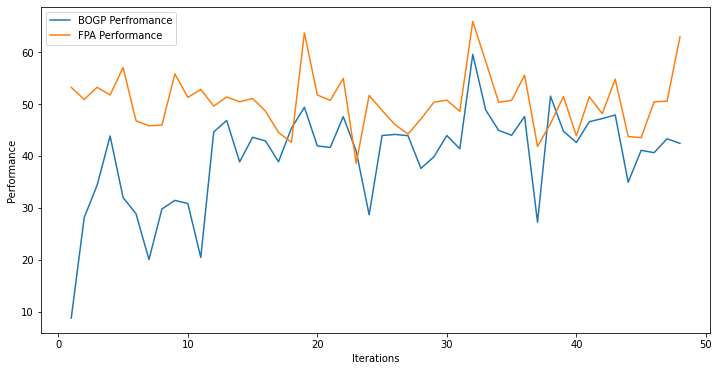

x_next is [ 39.9998948   39.99977595  39.99972643  39.99979036 -30.99990244
  39.9997435   39.9997513   39.99963895 -30.99938172  39.99984417
  39.99974274  39.99990178  39.99975045  39.99994233  39.99976556
  39.99955889  39.99999858 -30.99948452  39.99969551 -30.99987635]
f()=39.736152, actual=45.069
47


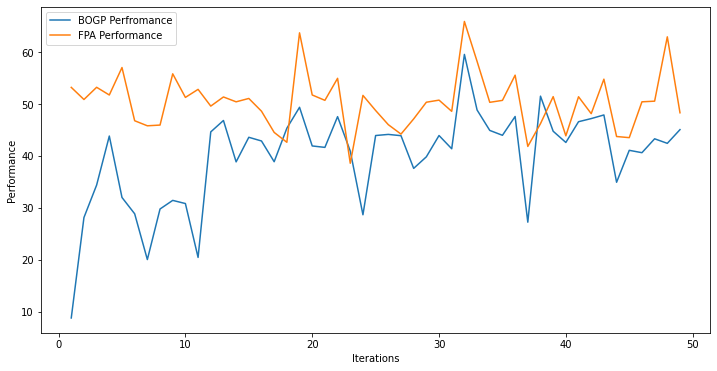

x_next is [ 40.          40.          40.          40.         -27.4587085
  40.          40.          40.           8.30977046  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.           4.84636266]
f()=45.218960, actual=39.562
48


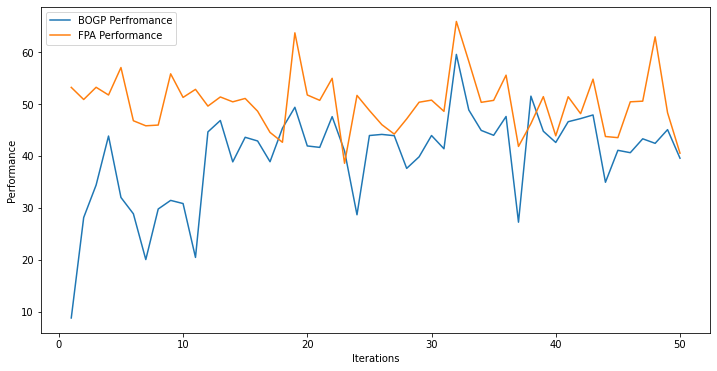

x_next is [ 40.          40.          40.          40.         -28.58438402
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.949928, actual=48.509
49


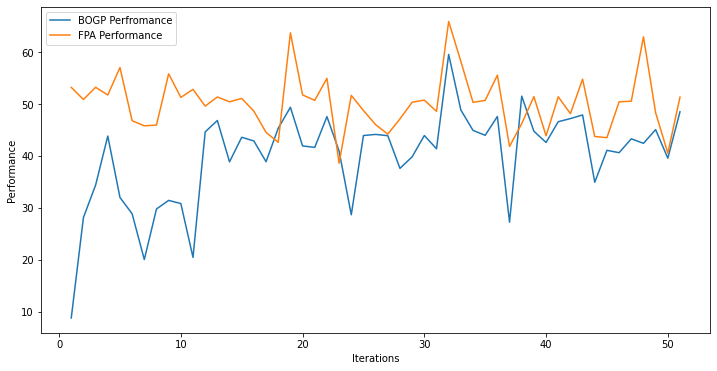

x_next is [ 40.          40.          40.          40.         -22.99830347
  40.          40.          40.         -31.          40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.088466, actual=39.711
50


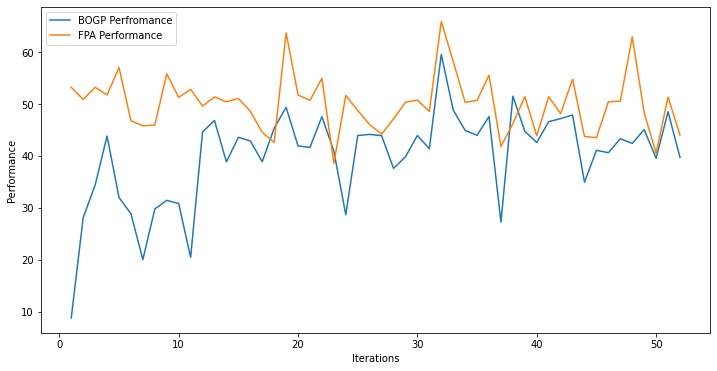

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.889600, actual=51.774
51


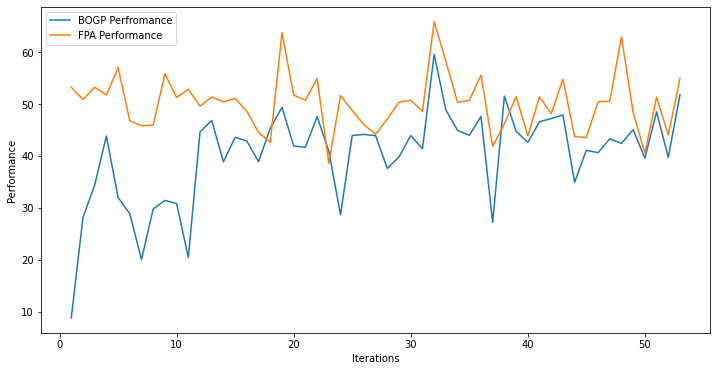

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.117301, actual=39.865
52


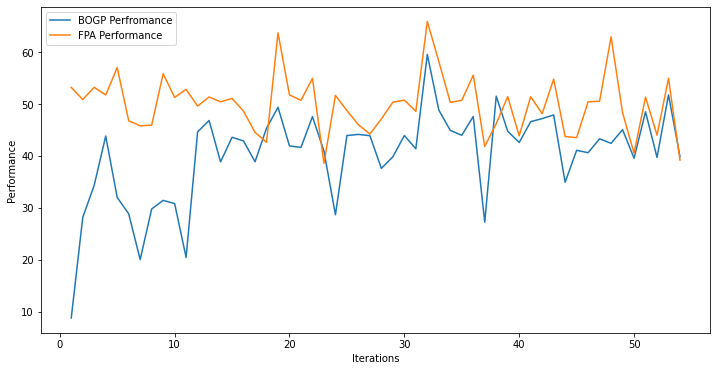

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.945509, actual=55.405
53


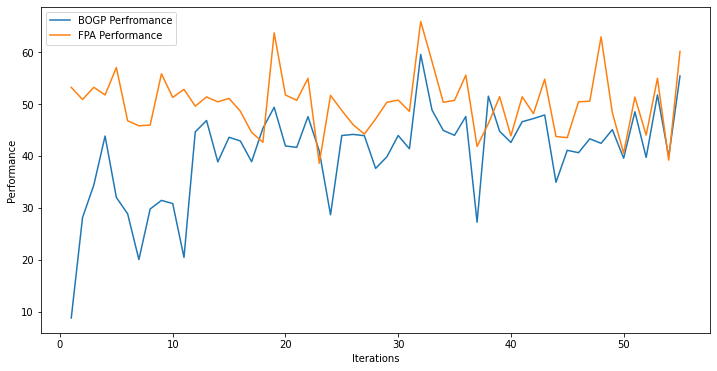

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.261371, actual=46.403
54


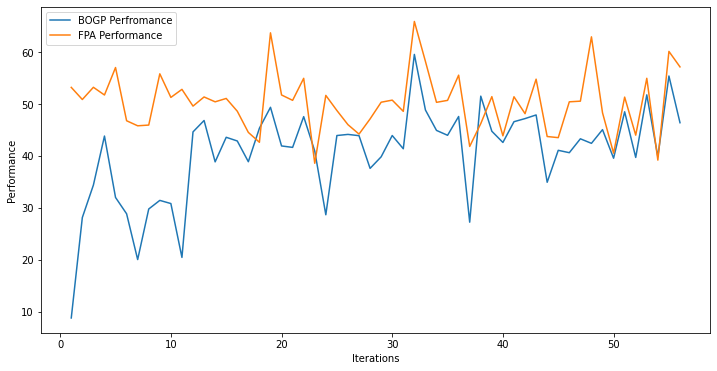

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.299311, actual=32.165
55


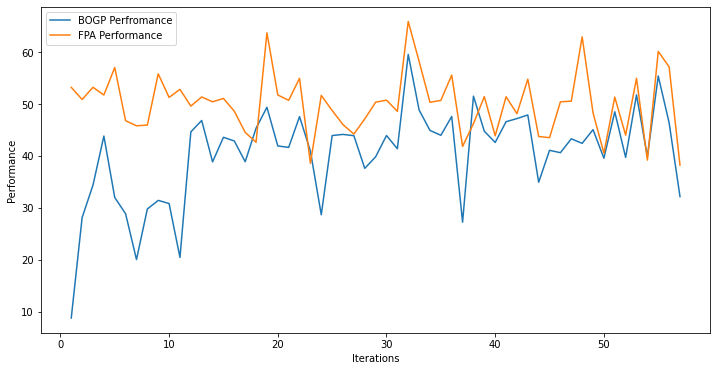

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.896470, actual=38.301
56


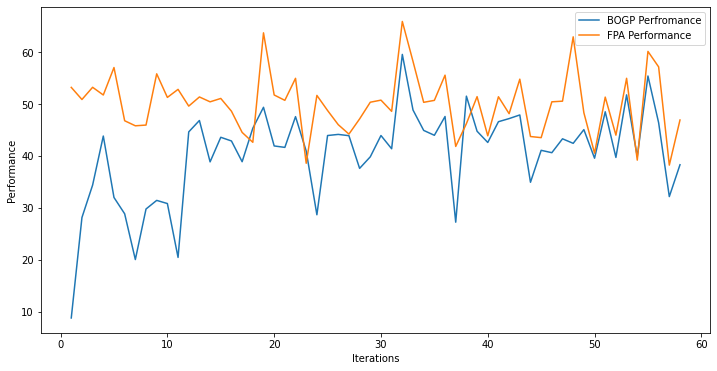

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.708814, actual=36.349
57


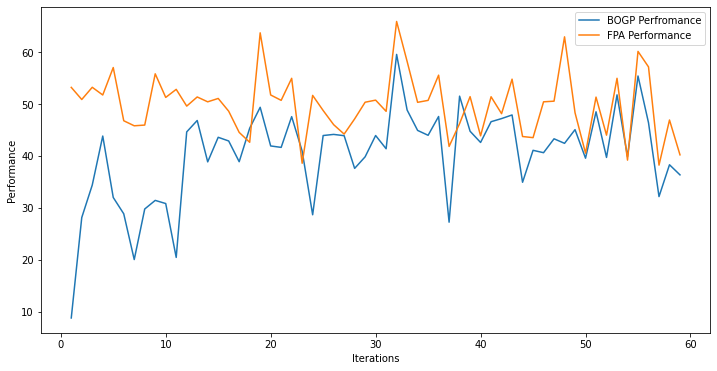

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.58009127  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.477274, actual=48.924
58


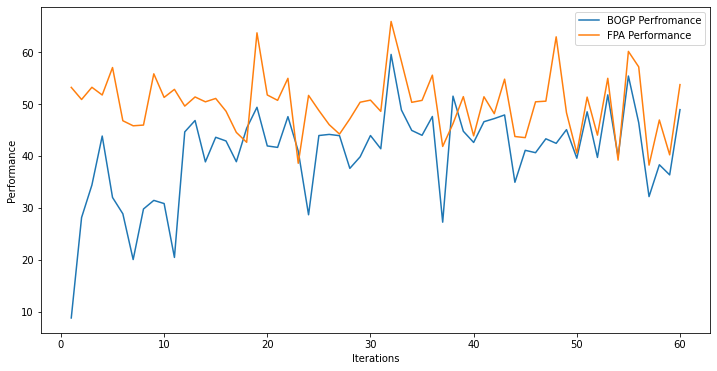

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.593788, actual=43.841
59


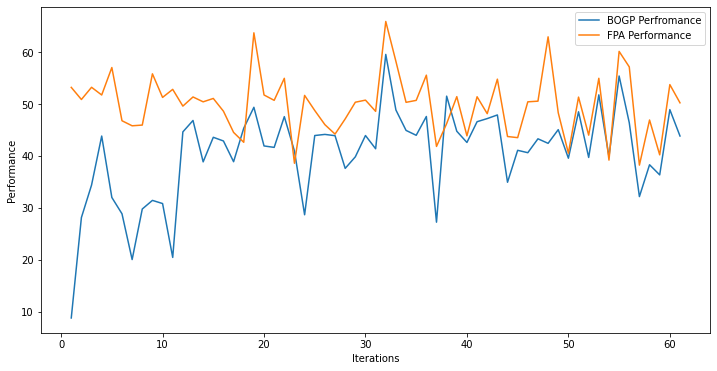

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.576060, actual=49.897
60


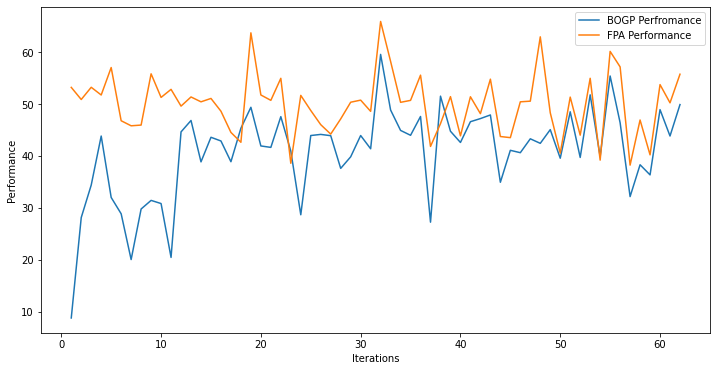

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.710547, actual=42.133
61


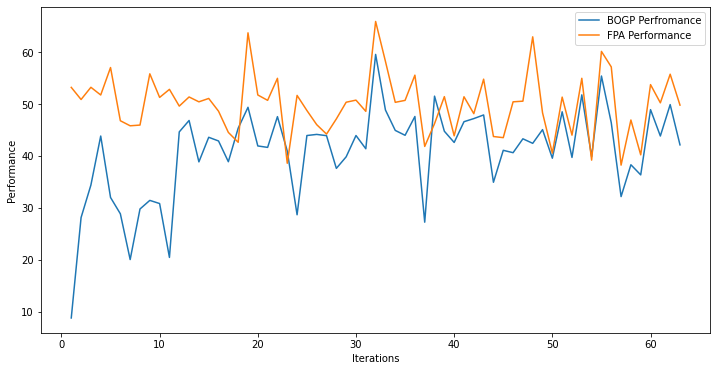

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.648216, actual=45.070
62


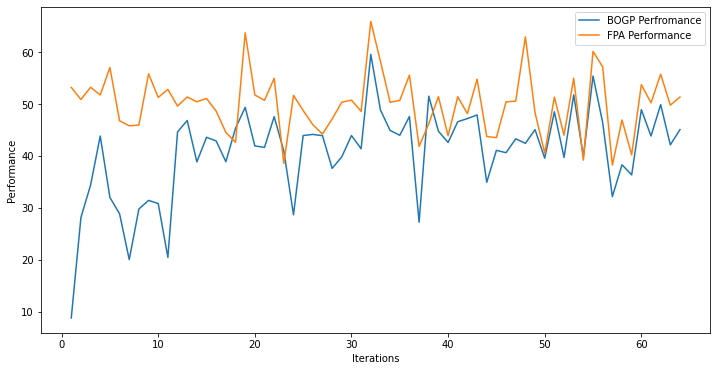

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.660016, actual=46.479
63


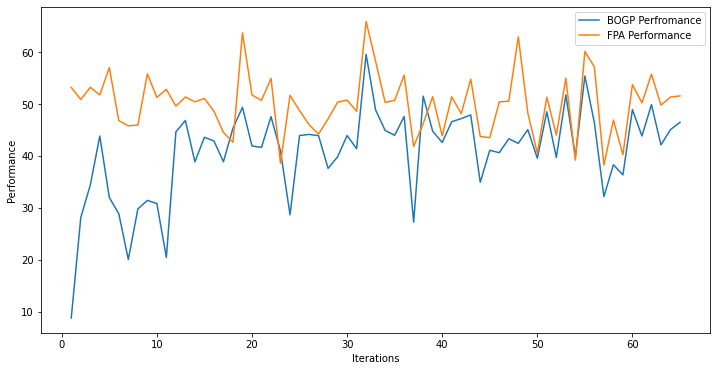

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.704271, actual=37.208
64


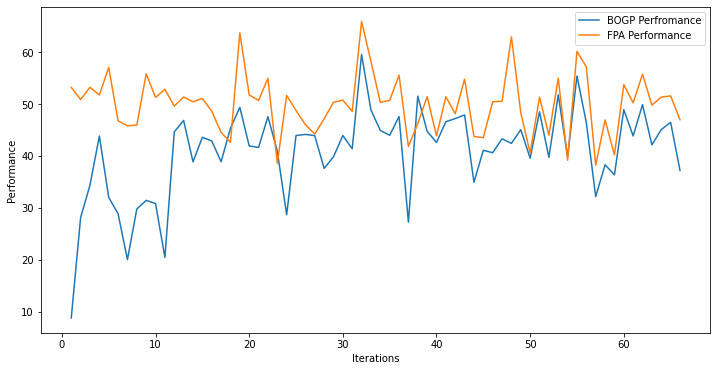

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.94960577  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.530464, actual=50.561
65


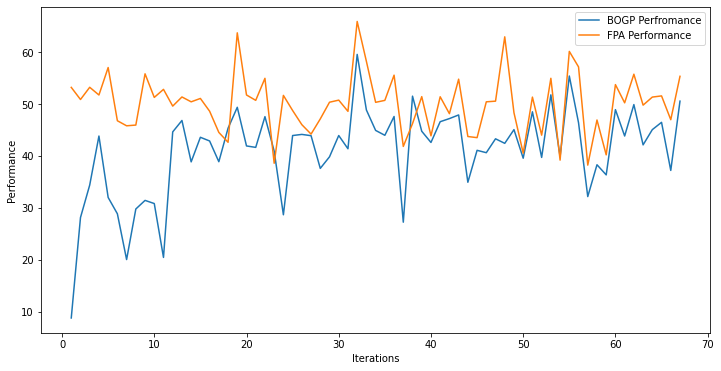

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.661709, actual=40.646
66


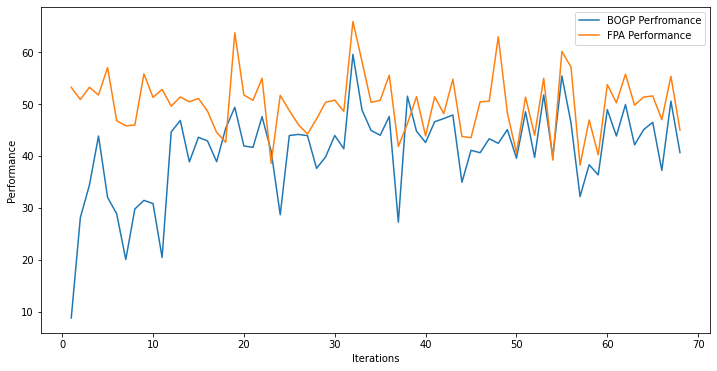

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.00790644  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.574980, actual=51.302
67


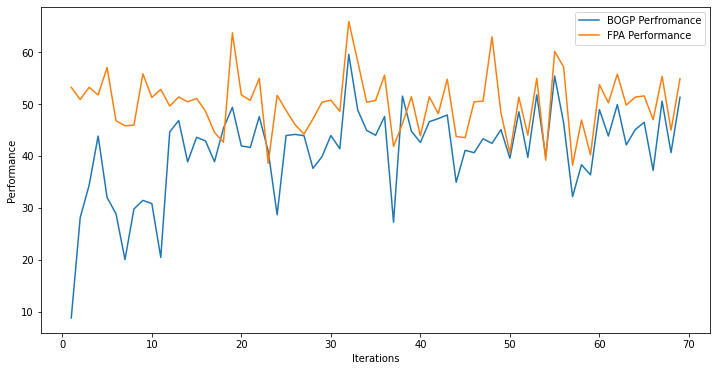

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.04232246  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.712699, actual=51.379
68


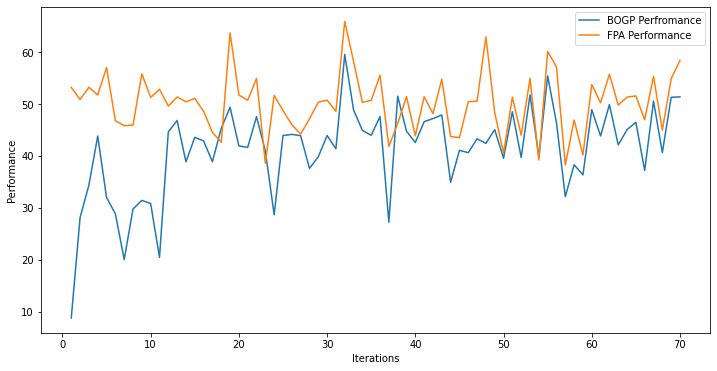

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.850855, actual=49.566
69


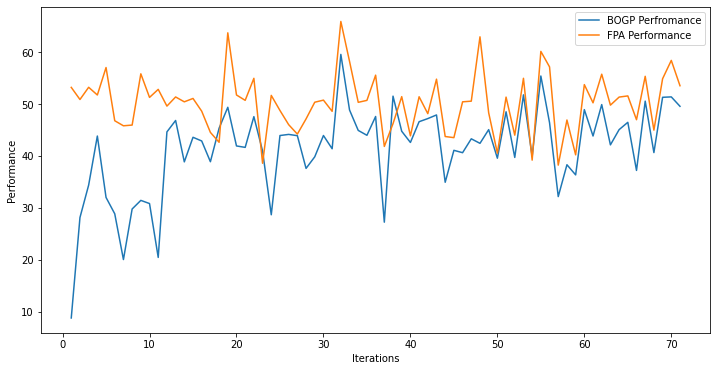

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.948709, actual=54.343
70


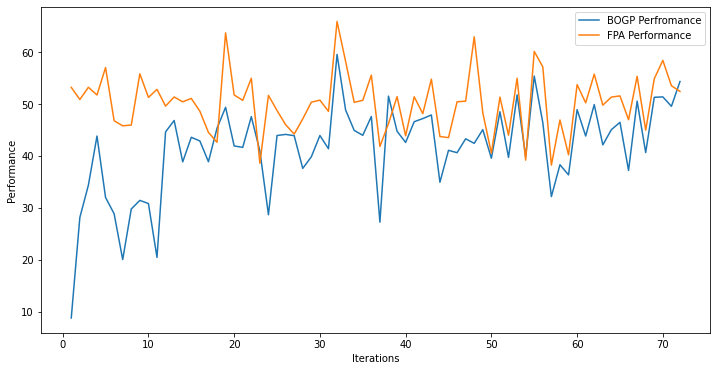

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.135855, actual=48.636
71


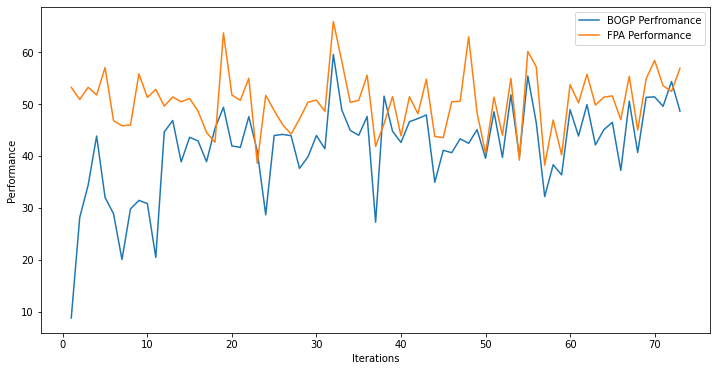

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.206354, actual=41.183
72


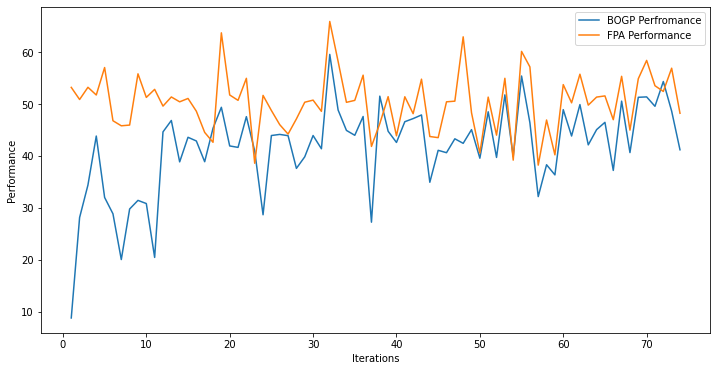

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.128451, actual=46.262
73


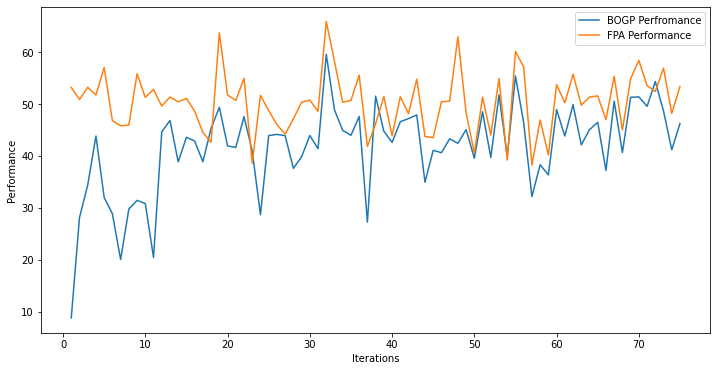

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.151519, actual=46.568
74


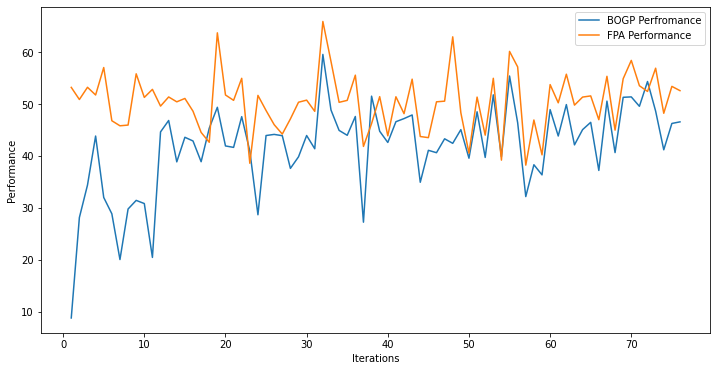

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.179440, actual=43.182
75


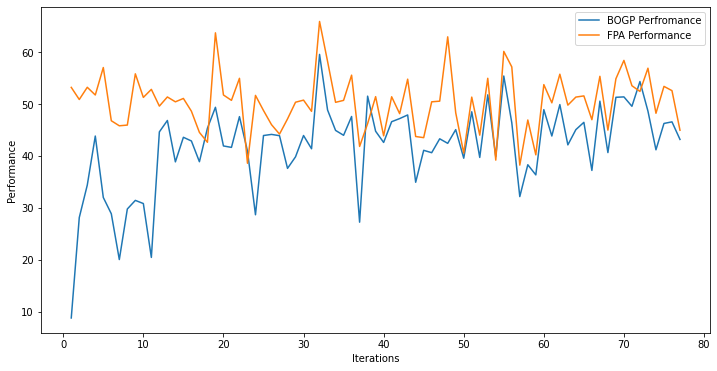

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.143676, actual=50.924
76


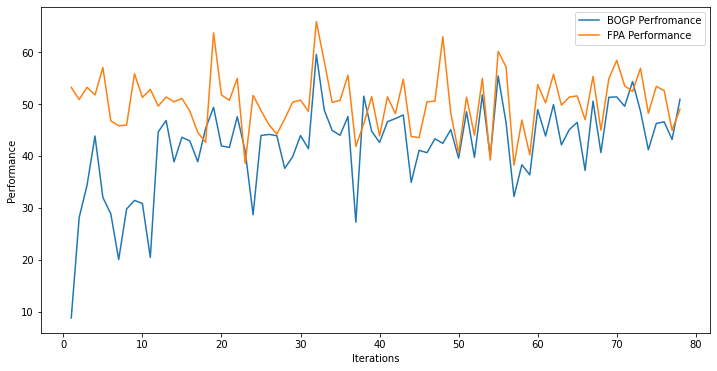

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.248151, actual=46.177
77


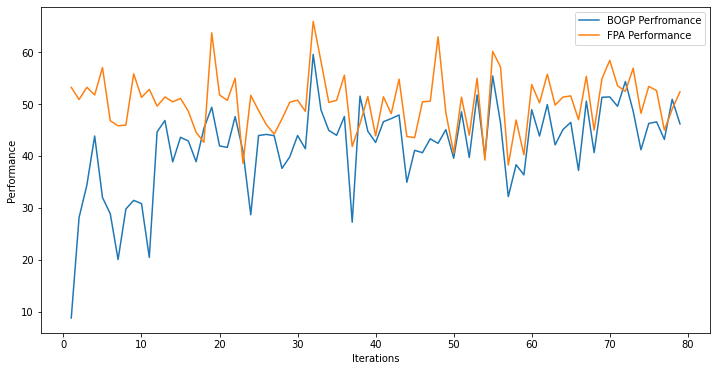

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.265987, actual=40.547
78


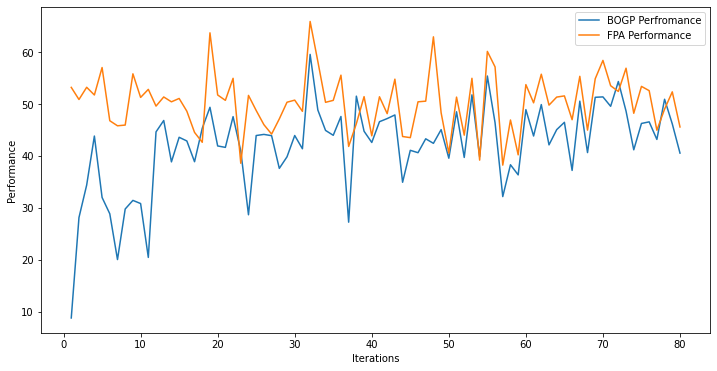

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.183454, actual=46.009
79


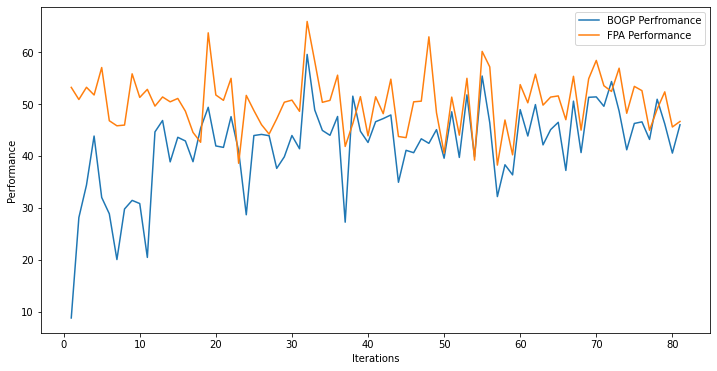

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.198807, actual=48.229
80


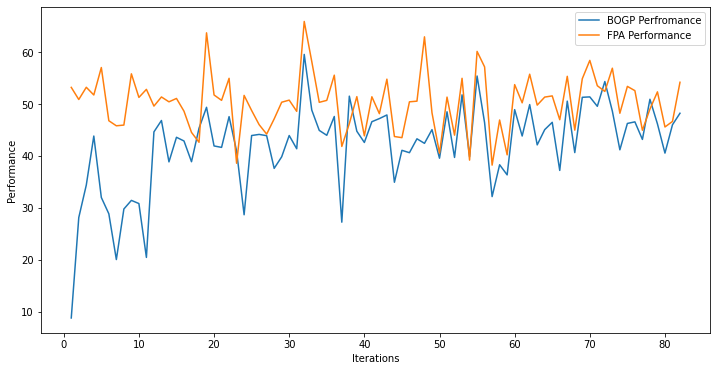

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.250877, actual=43.247
81


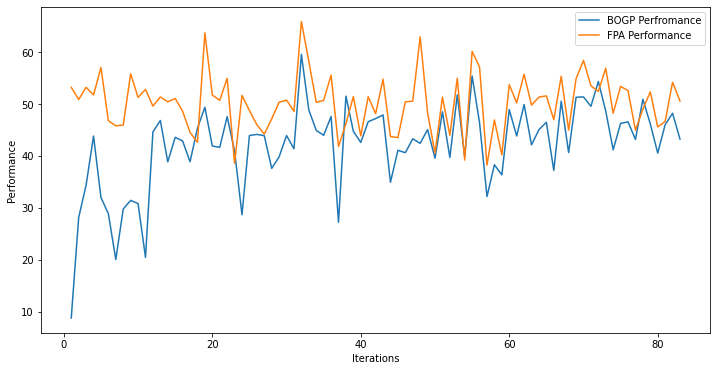

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.218399, actual=45.223
82


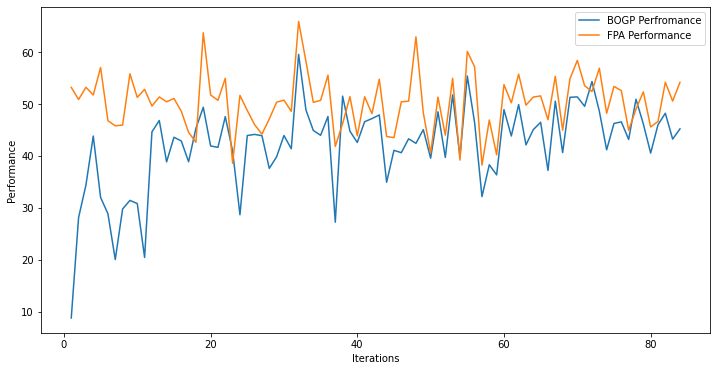

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.219550, actual=44.602
83


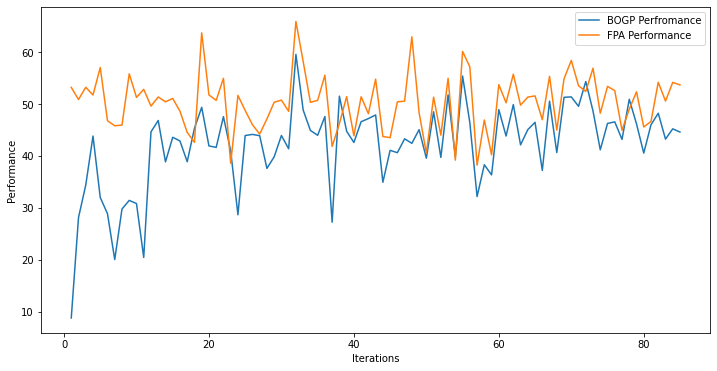

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.210597, actual=47.331
84


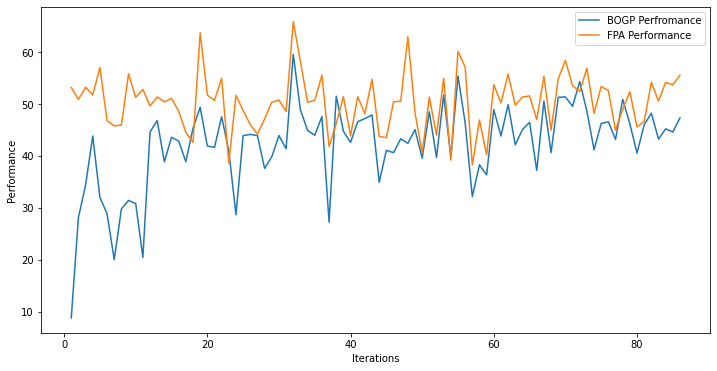

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.245136, actual=37.684
85


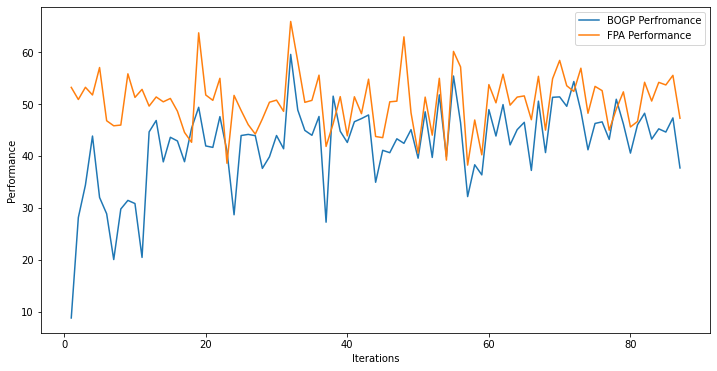

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.125496, actual=49.771
86


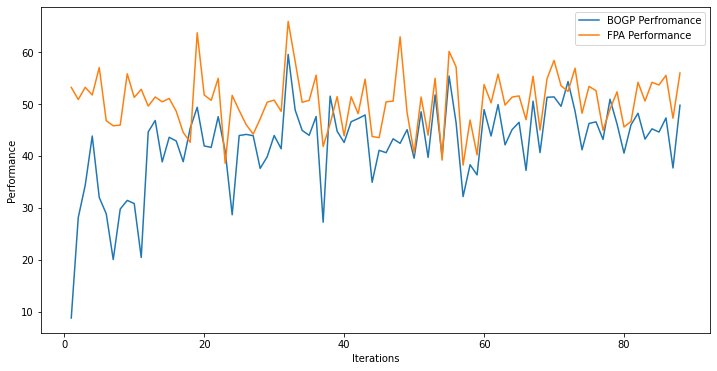

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.197116, actual=47.140
87


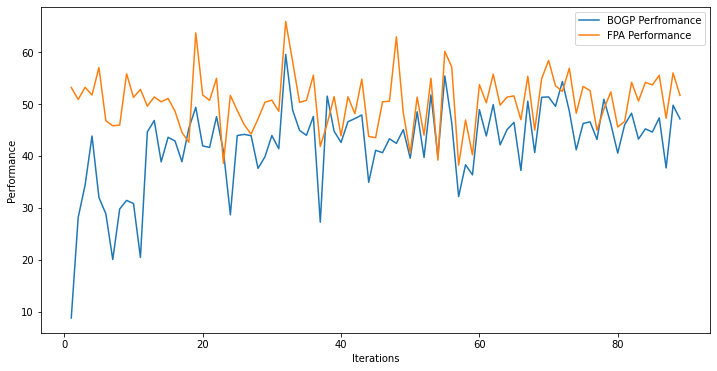

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.227367, actual=41.024
88


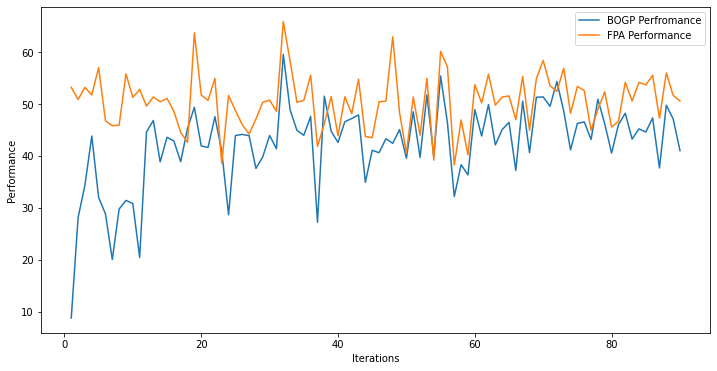

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.164752, actual=41.855
89


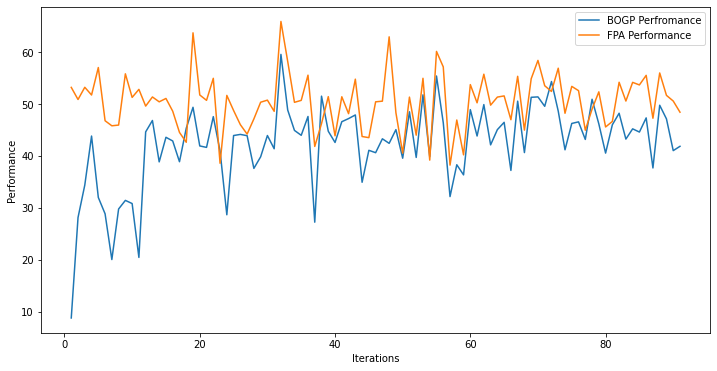

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.116445, actual=48.786
90


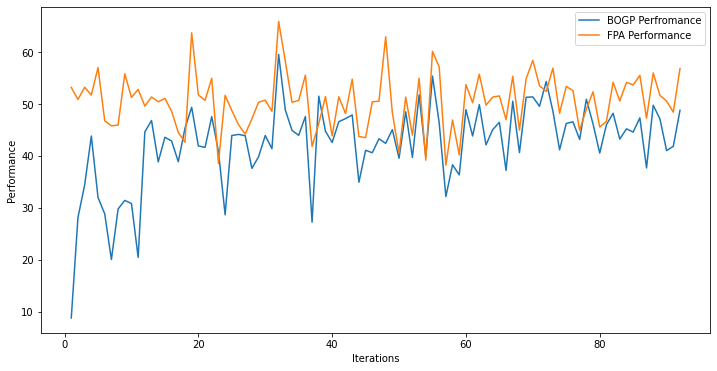

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.170056, actual=41.711
91


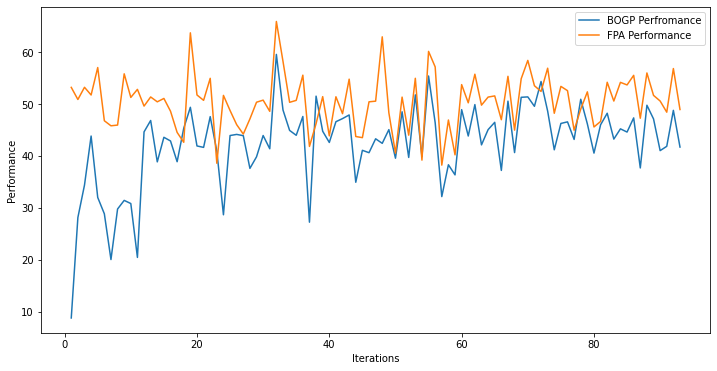

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.120918, actual=44.137
92


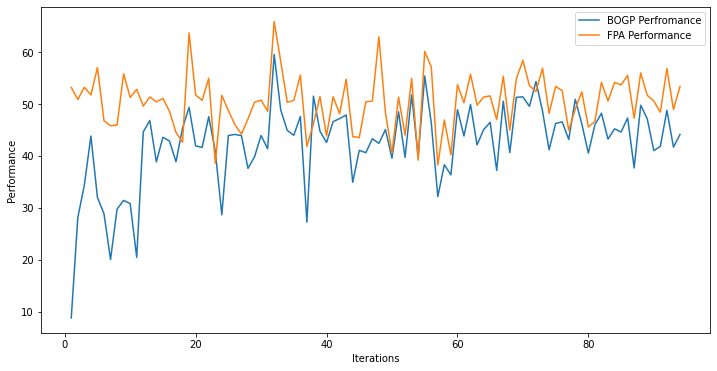

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.107738, actual=44.754
93


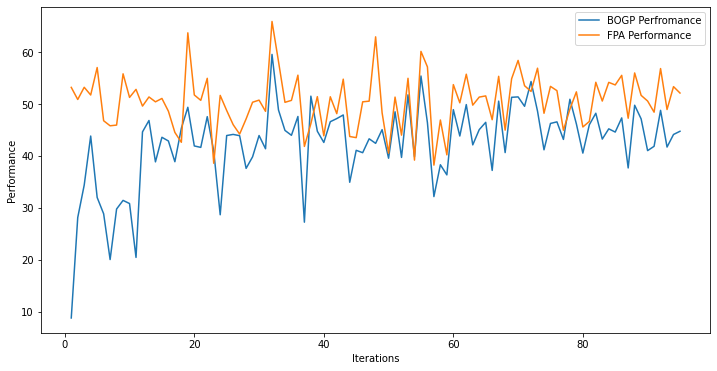

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.103517, actual=44.303
94


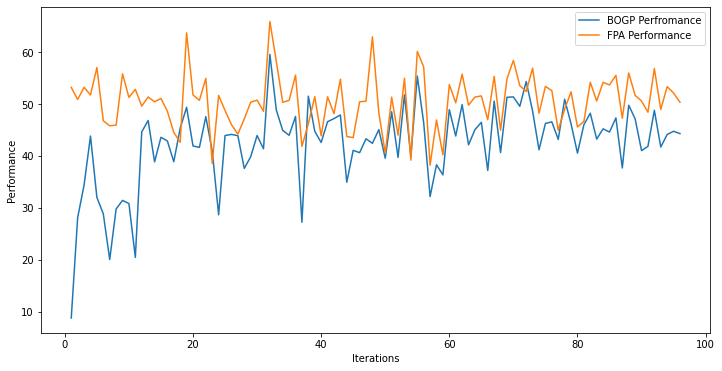

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.093178, actual=47.589
95


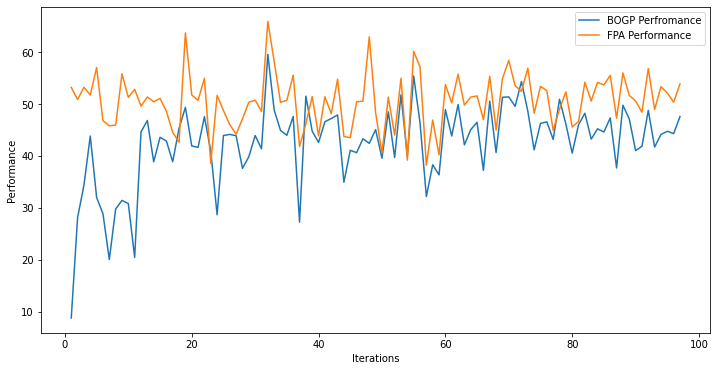

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.127495, actual=54.038
96


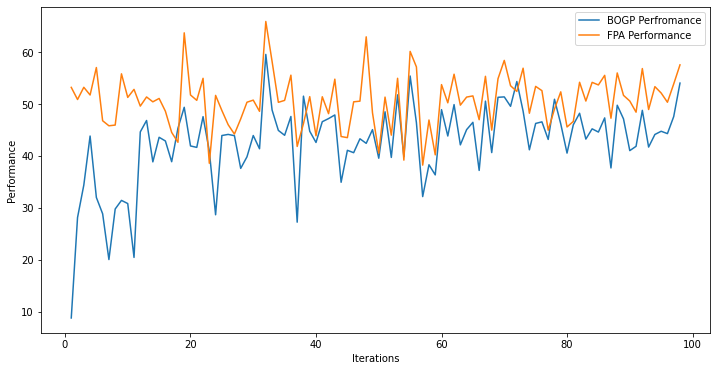

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.244960, actual=44.691
97


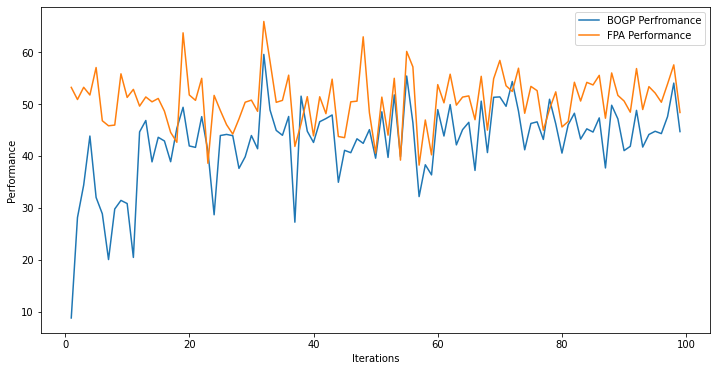

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.238346, actual=46.375
98


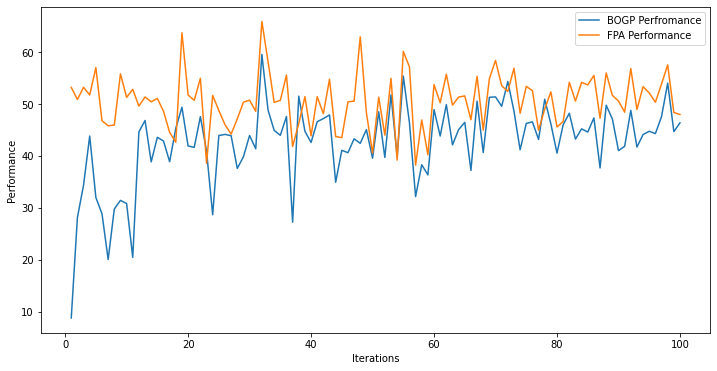

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.253804, actual=40.757
99


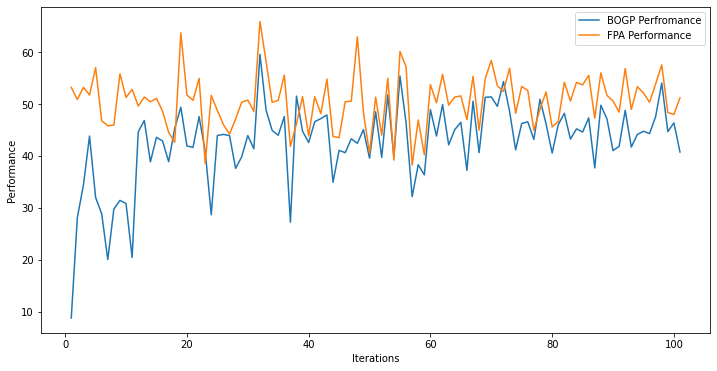

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.195994, actual=43.641
100


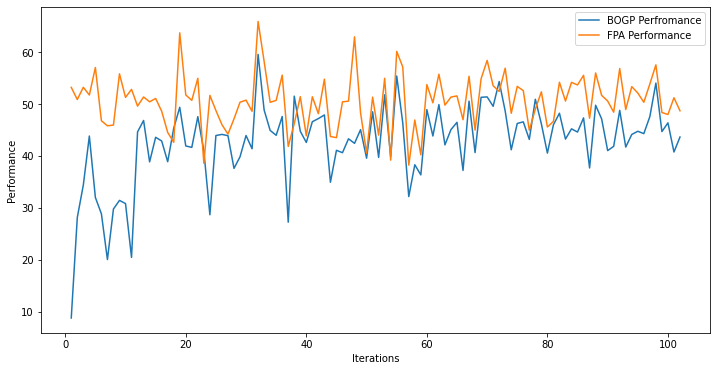

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.176790, actual=40.069
101


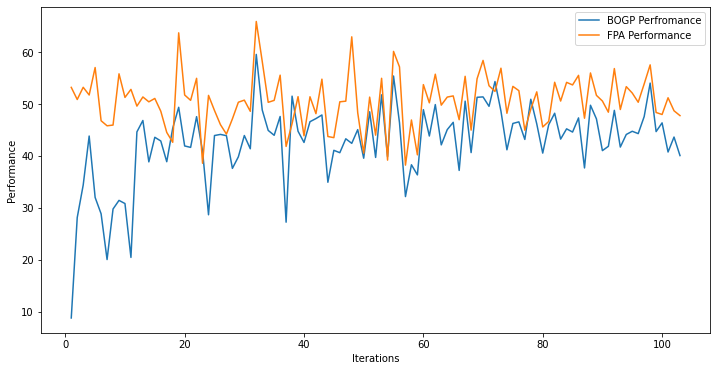

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.112616, actual=49.762
102


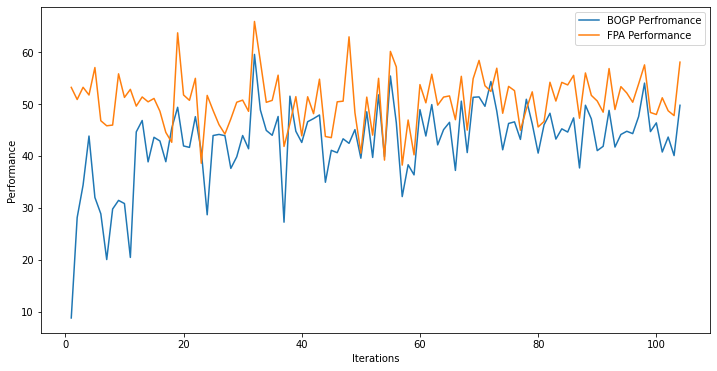

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.170232, actual=42.391
103


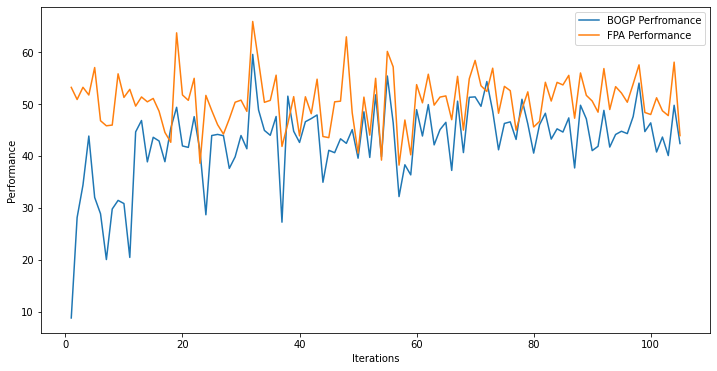

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.136584, actual=44.931
104


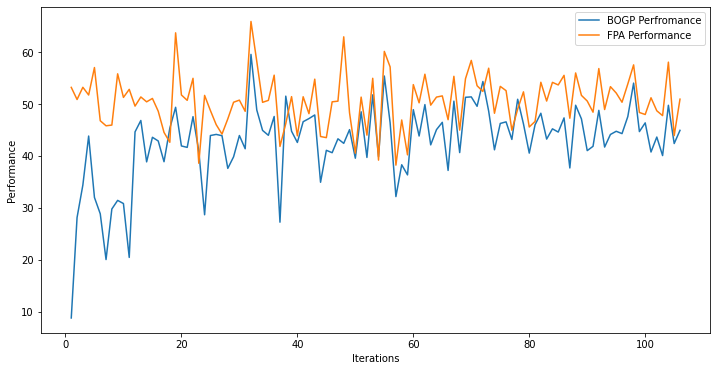

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.134645, actual=40.127
105


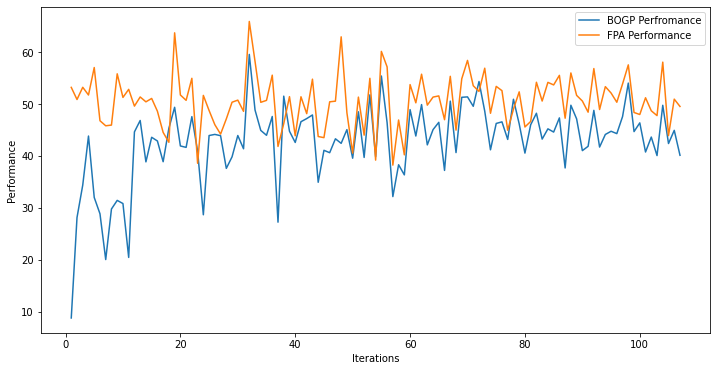

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.074726, actual=46.017
106


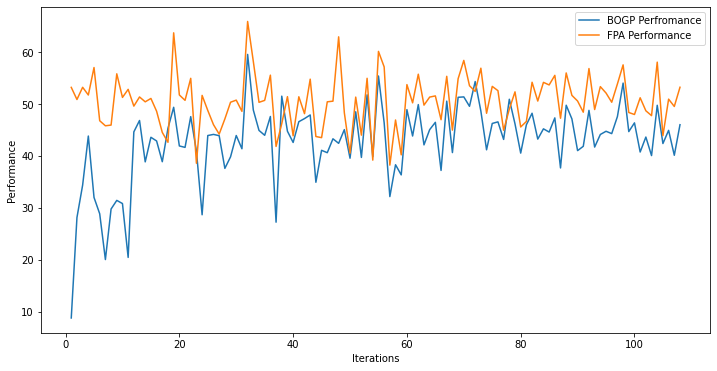

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.086337, actual=48.558
107


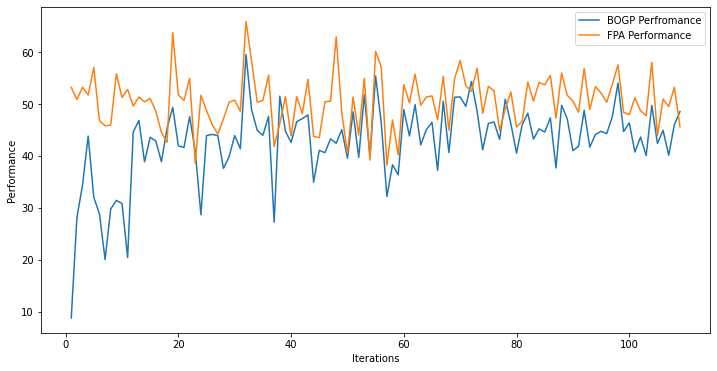

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.127094, actual=38.114
108


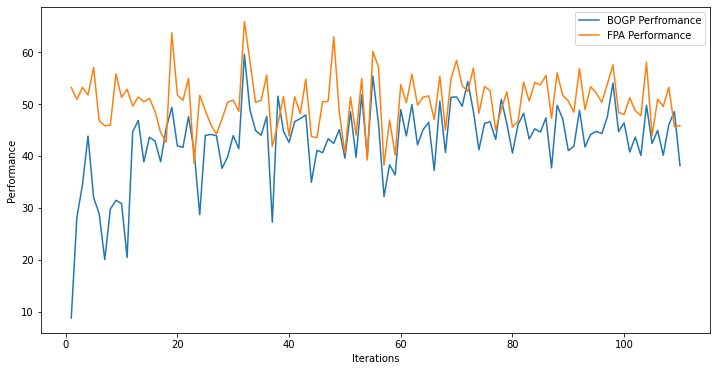

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.045568, actual=33.865
109


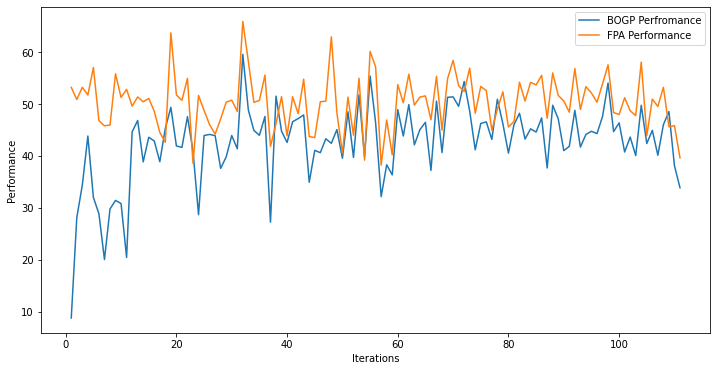

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.916227, actual=42.961
110


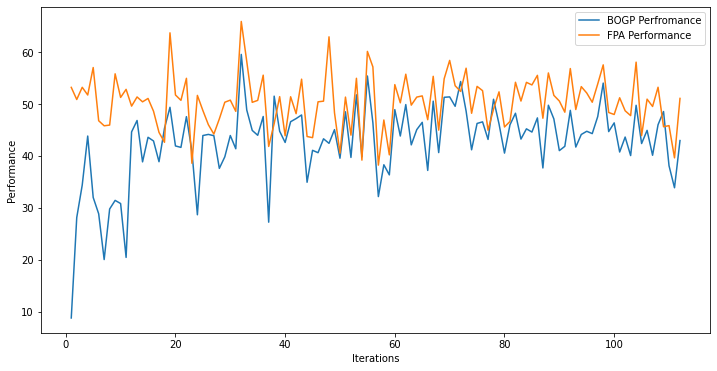

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.894575, actual=40.964
111


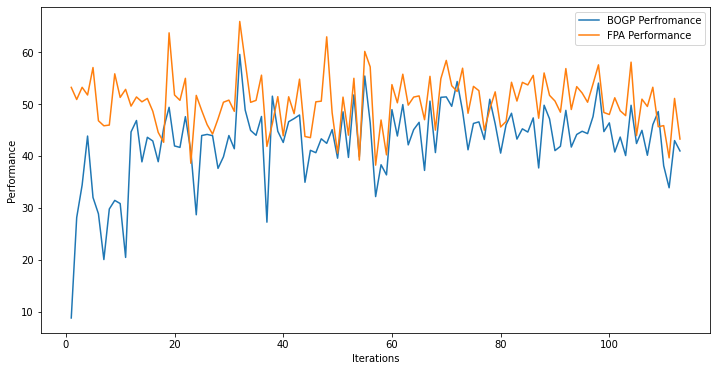

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.56194846  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.850991, actual=38.982
112


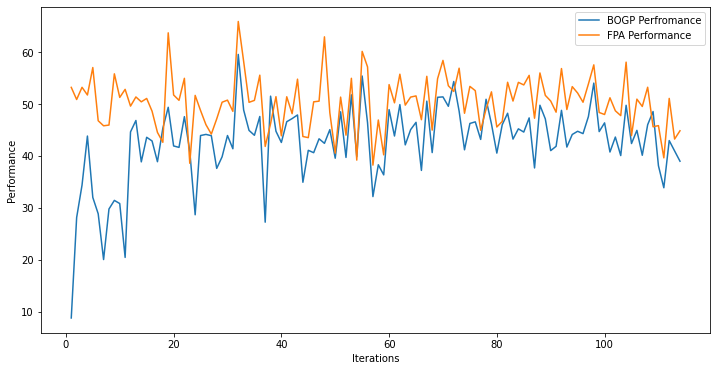

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.39801246  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.787575, actual=41.809
113


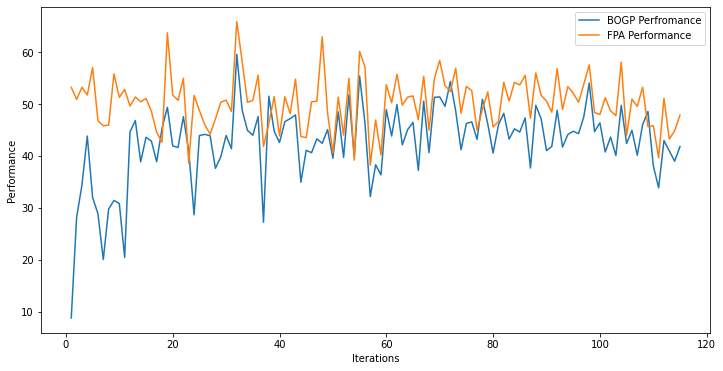

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.66419548  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.756286, actual=41.616
114


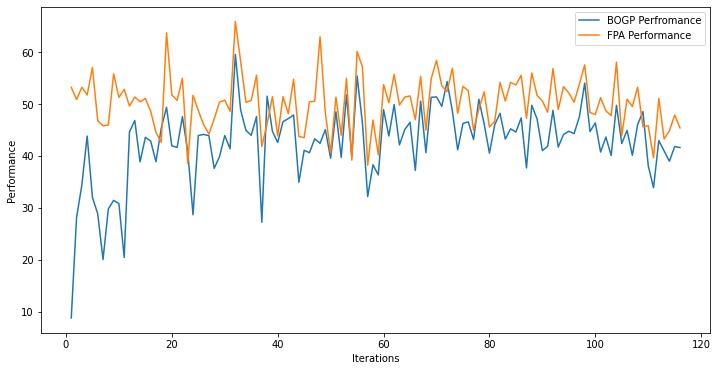

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.76025713  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.723634, actual=39.403
115


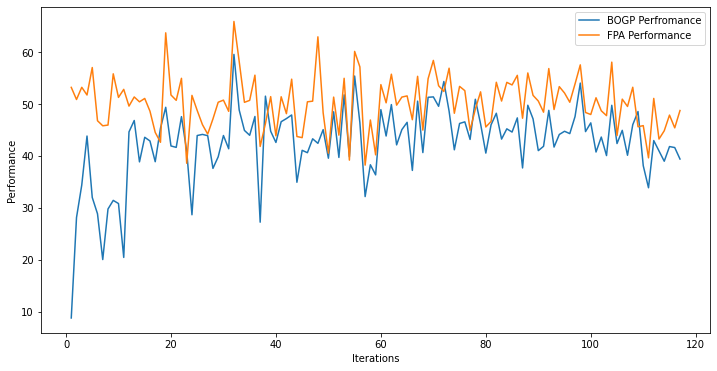

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.14011407  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.668318, actual=48.912
116


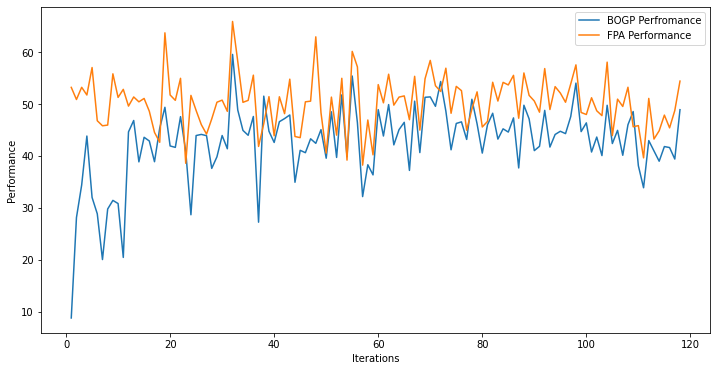

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -29.2564273  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=44.711985, actual=50.527
117


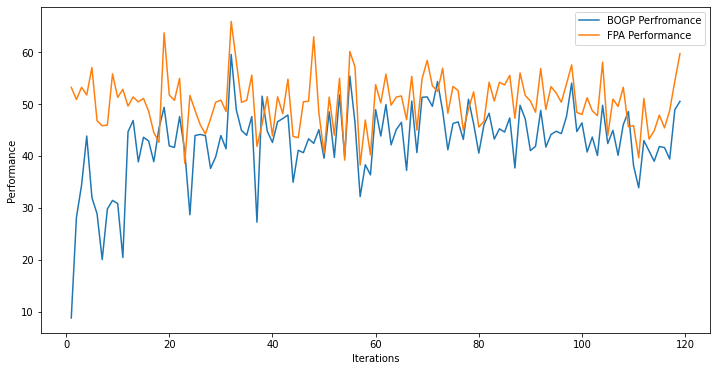

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.78095276  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.770933, actual=44.752
118


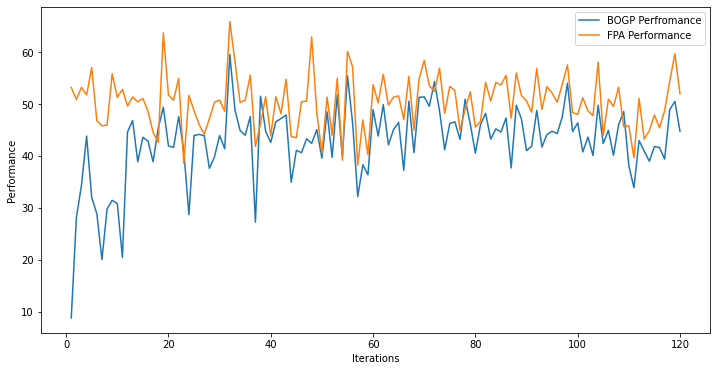

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -29.5027596  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=44.771150, actual=53.268
119


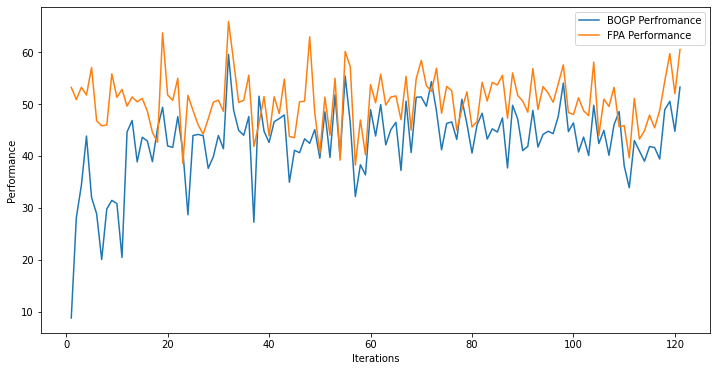

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=44.855422, actual=43.577
120


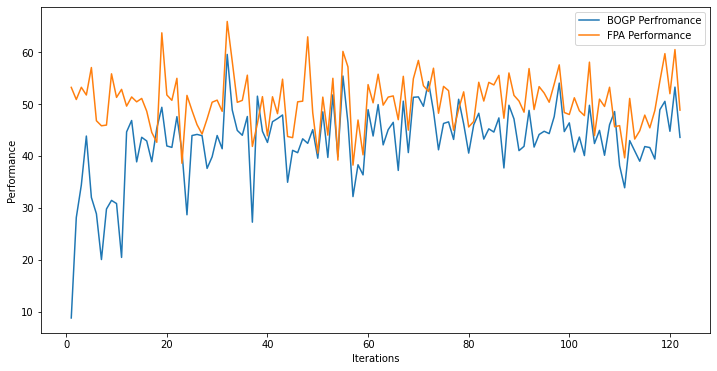

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.25709121  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.842809, actual=39.708
121


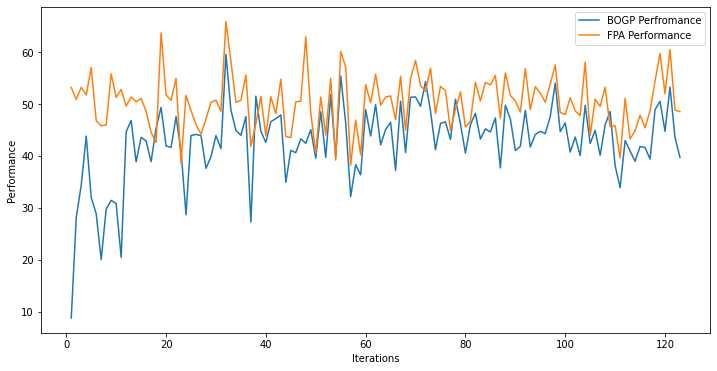

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.74159214  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.792383, actual=58.894
122


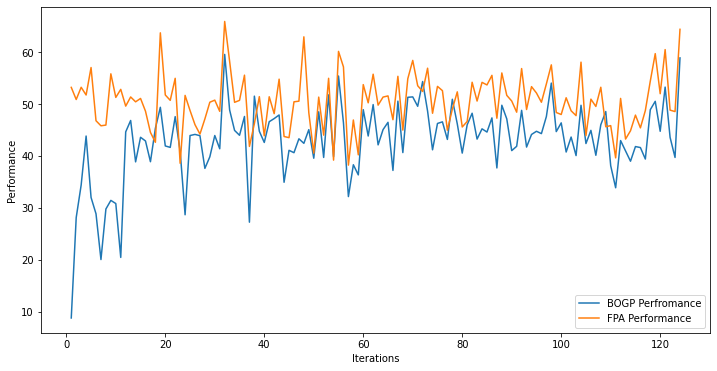

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.72411317  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.925367, actual=45.639
123


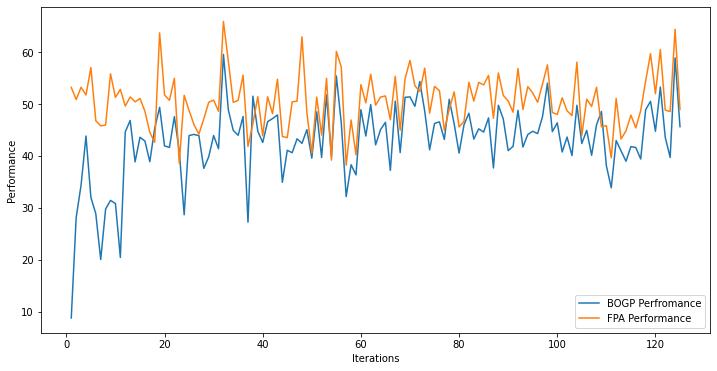

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.57890535  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.932623, actual=46.938
124


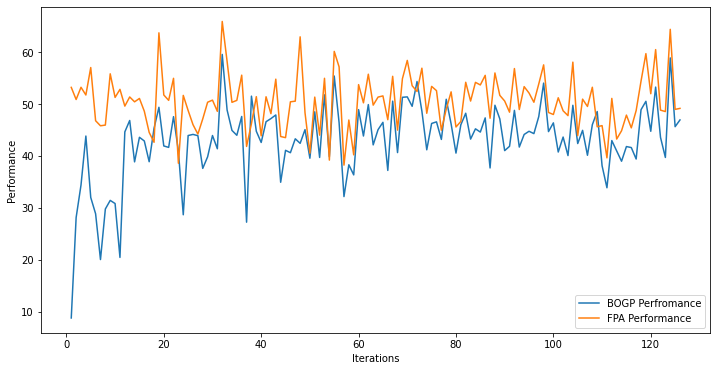

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.60551654  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.952036, actual=46.658
125


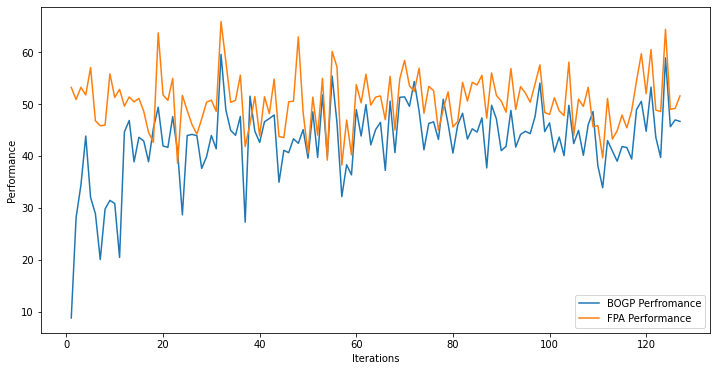

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.59241466  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.968468, actual=47.293
126


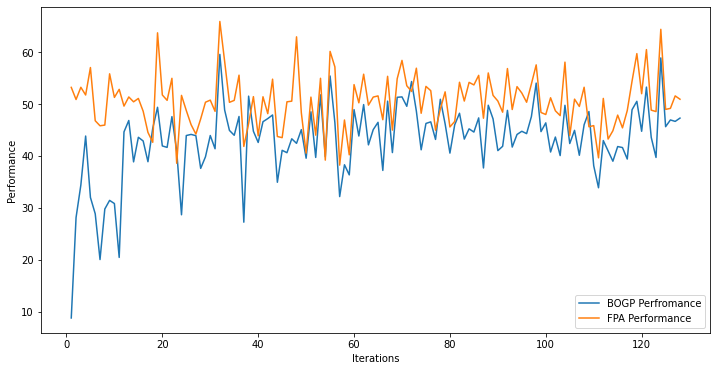

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.67511026  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.990478, actual=48.071
127


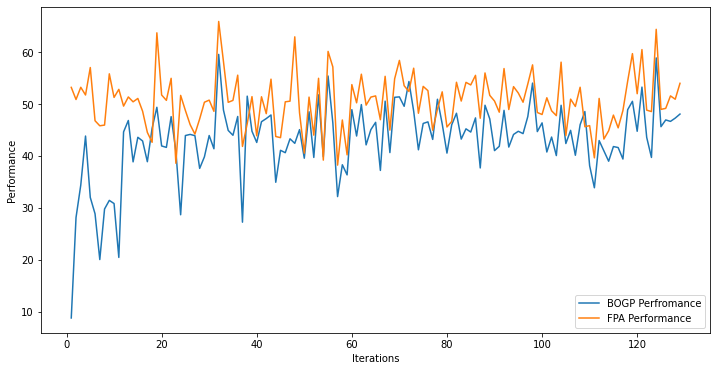

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.94973556  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.019237, actual=48.737
128


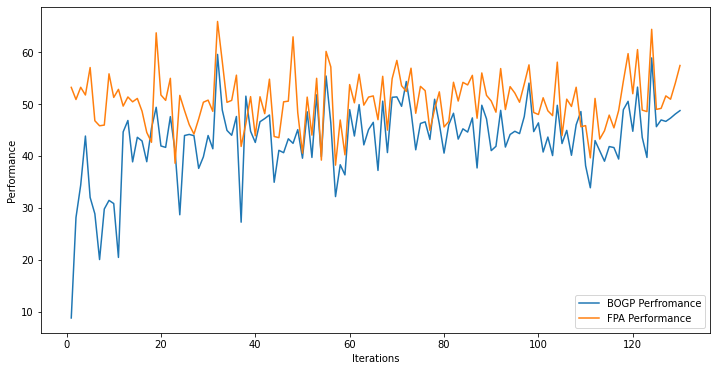

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -30.6266845  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.053658, actual=41.625
129


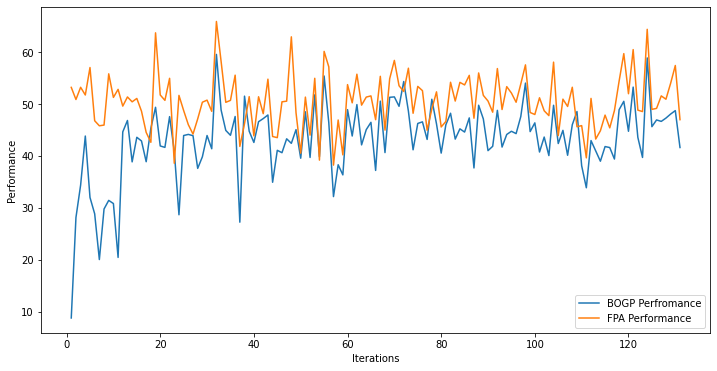

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.25036125  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.022448, actual=44.183
130


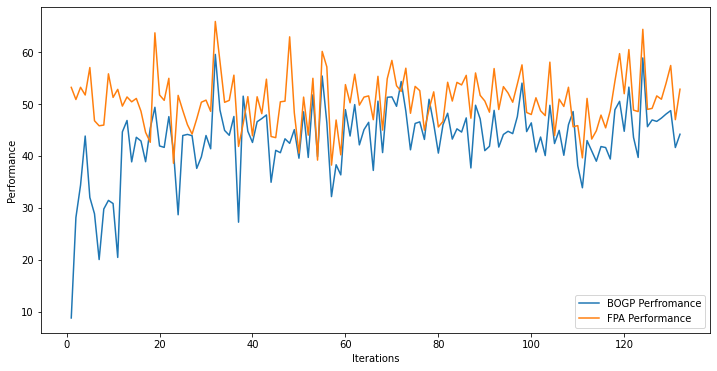

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -28.9895027  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.015315, actual=38.705
131


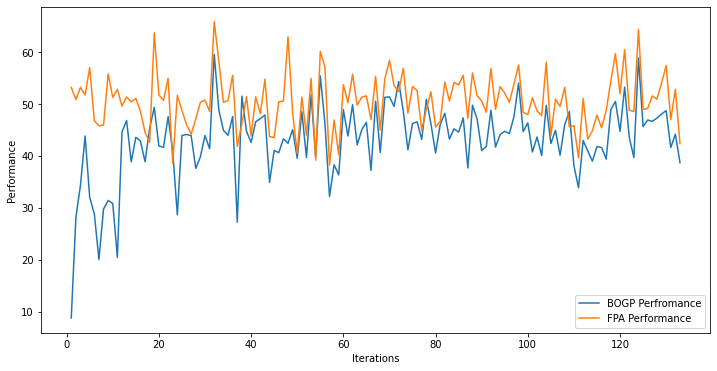

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -29.33289573  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.958846, actual=53.133
132


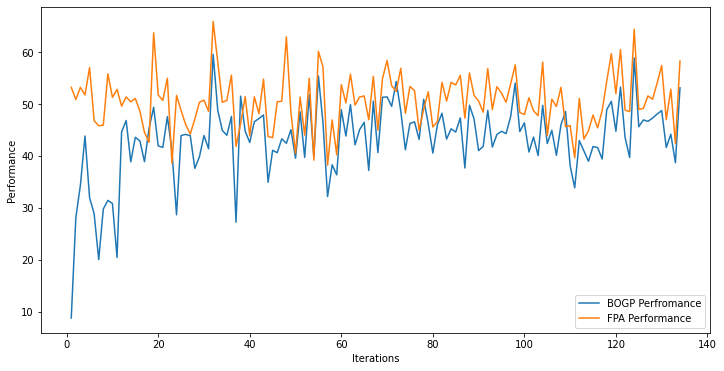

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.23018748  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.030395, actual=38.235
133


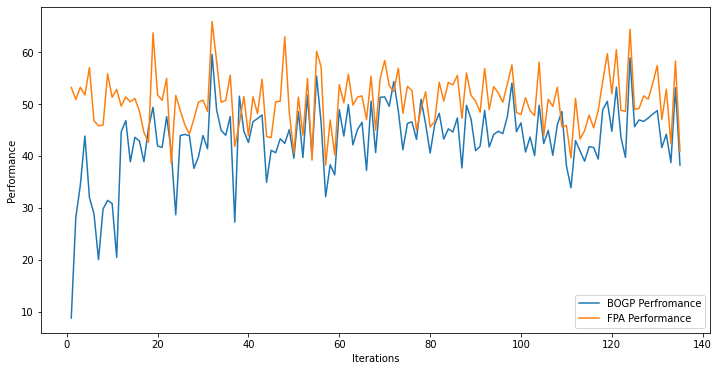

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.71875979  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.970429, actual=46.169
134


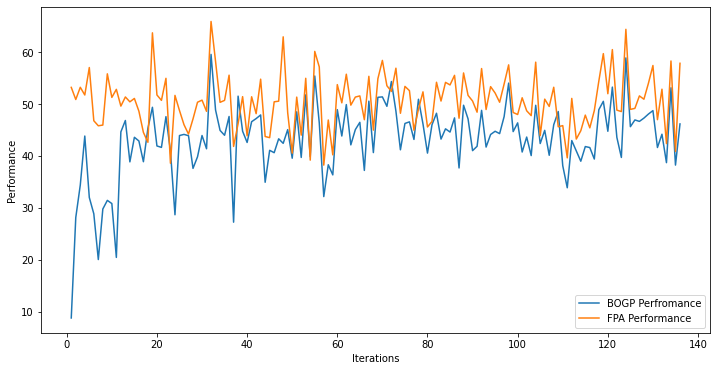

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.40437604  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.981240, actual=45.366
135


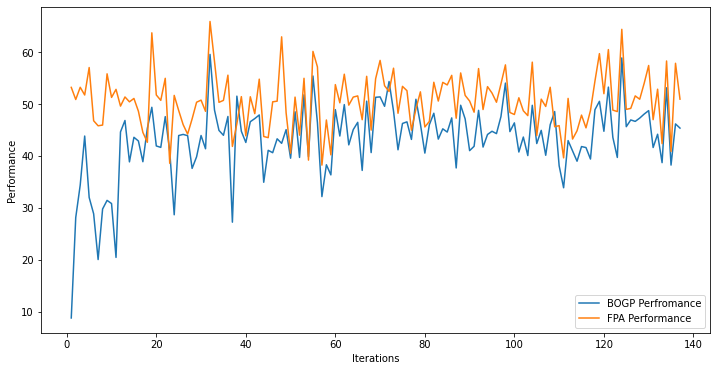

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.12359831  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.985010, actual=46.011
136


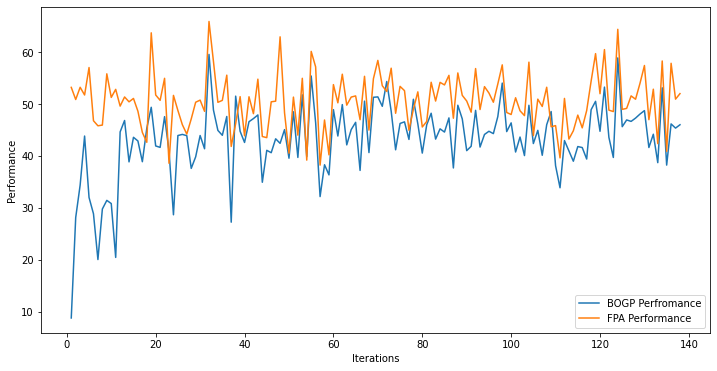

x_next is [ 39.99994461  39.99988906  39.99991161  39.99990463 -30.9999025
  39.99989028  39.99986598  39.99986976 -30.99998252  39.99997637
  39.99998453  39.99968812  39.9999547   39.99996807  39.99996914
  39.99989811  39.99995802 -30.99987545  39.99974291 -30.99996697]
f()=43.152766, actual=39.646
137


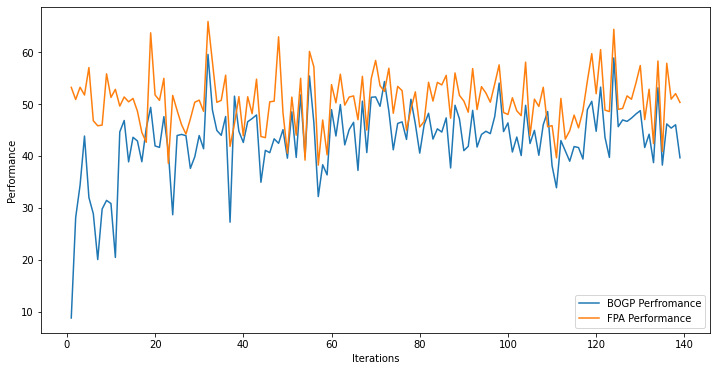

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.62334733  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.950818, actual=52.987
138


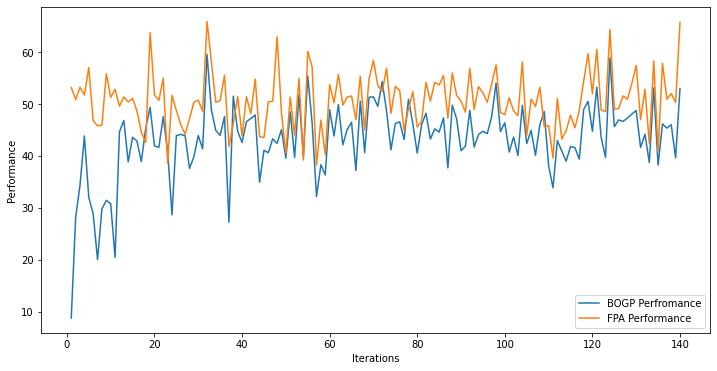

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -20.59062522  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.028448, actual=47.366
139


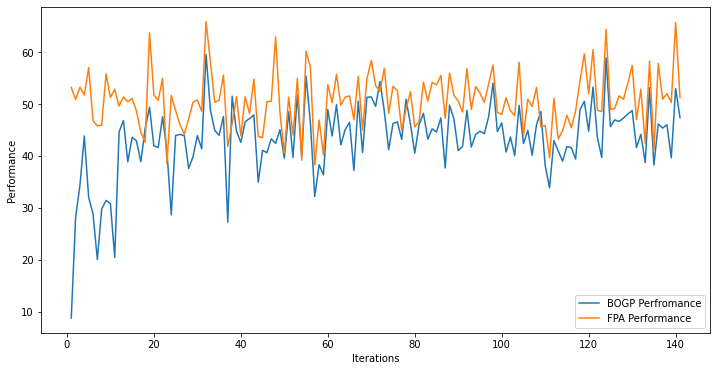

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -16.3601403  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.063359, actual=53.513
140


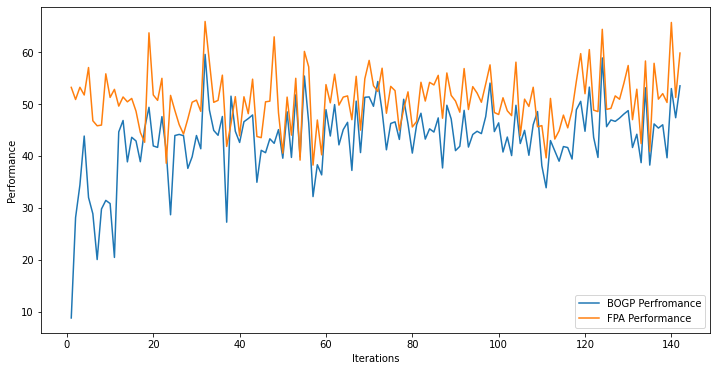

x_next is [ 40.        40.        40.        40.       -31.        40.
  40.        40.         8.147695  40.        40.        40.
  40.        40.        40.        40.        40.       -31.
  40.       -31.      ]
f()=45.302451, actual=42.804
141


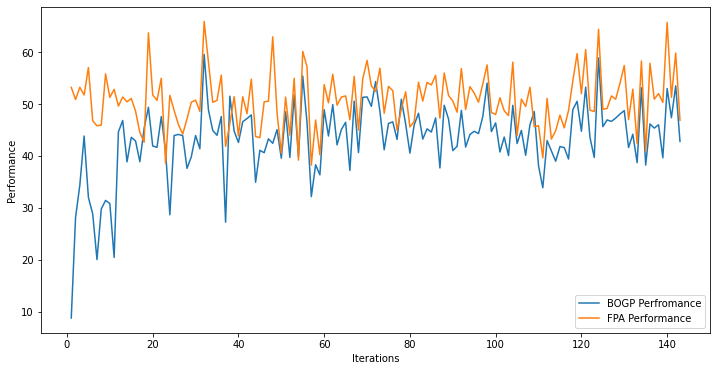

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -12.35502078  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.137610, actual=52.548
142


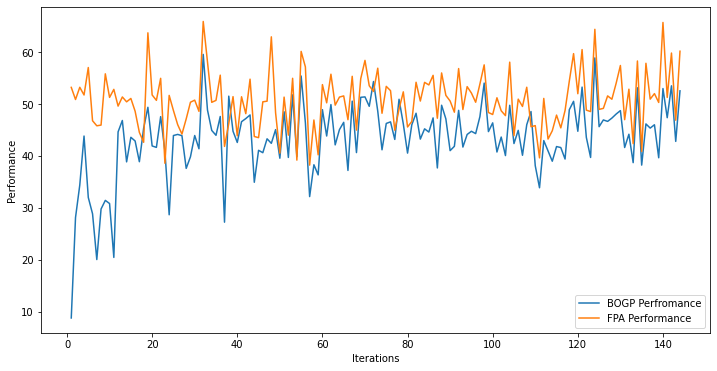

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.          11.87292258  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.395397, actual=42.681
143


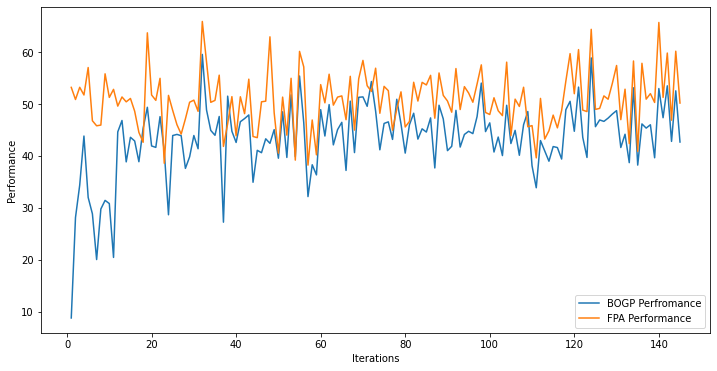

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.          -9.18528837  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.204513, actual=42.987
144


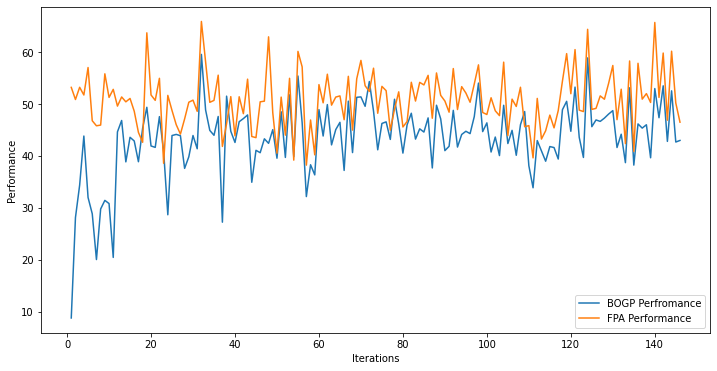

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -14.98103594  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.150470, actual=48.436
145


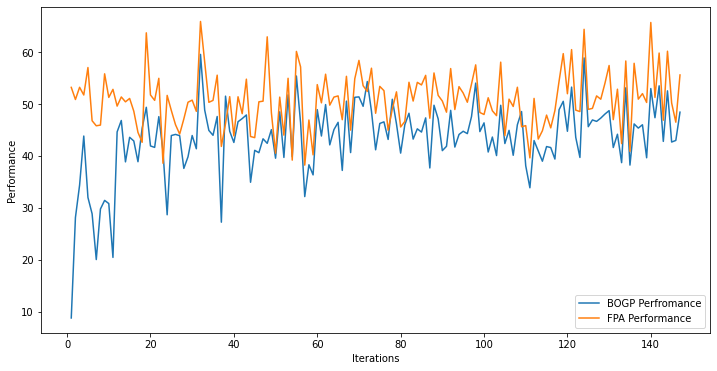

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.          -9.11234121  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.215423, actual=42.144
146


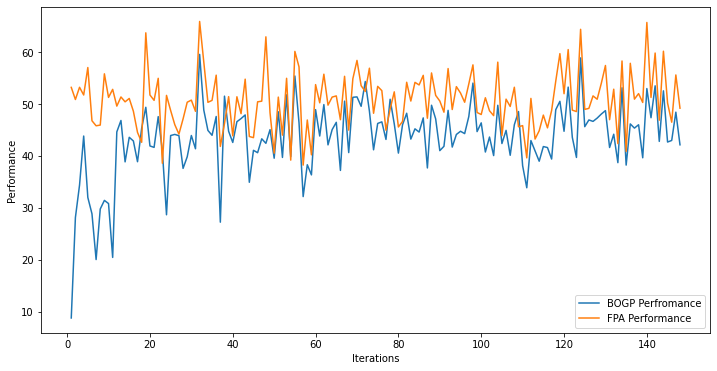

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -16.69323173  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.145412, actual=39.628
147


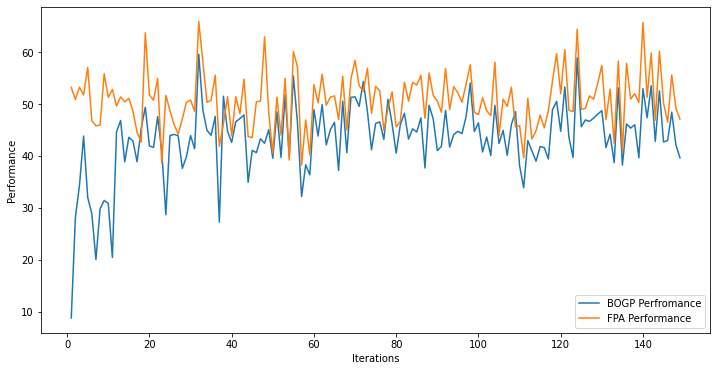

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -24.79740413  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.078114, actual=39.876
148


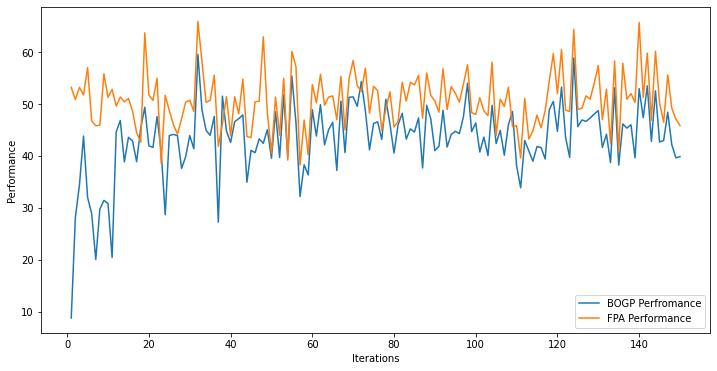

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -27.06810418  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.035948, actual=46.663
149


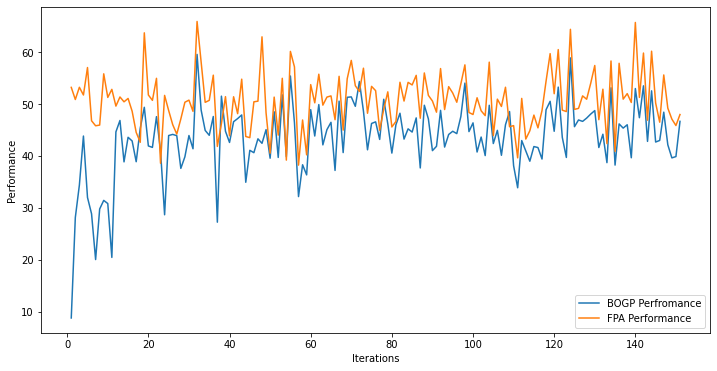

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.74547173  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.048917, actual=43.157
150


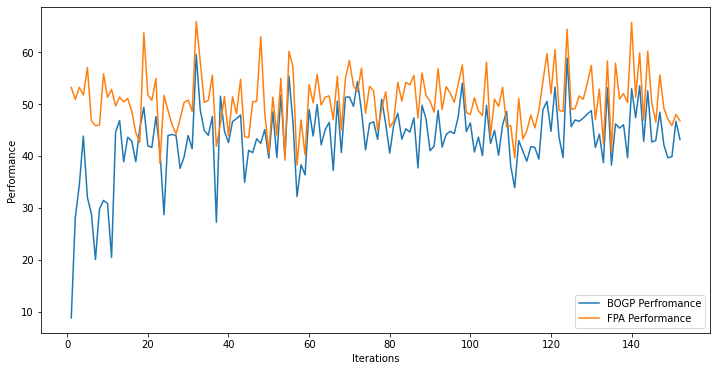

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.91119174  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.034669, actual=54.317
151


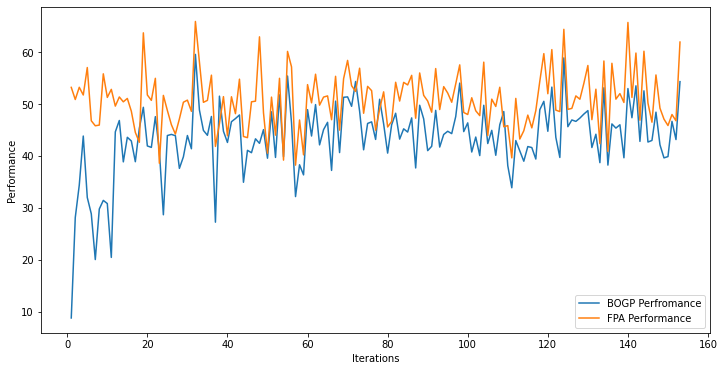

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.16630831  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.104595, actual=46.341
152


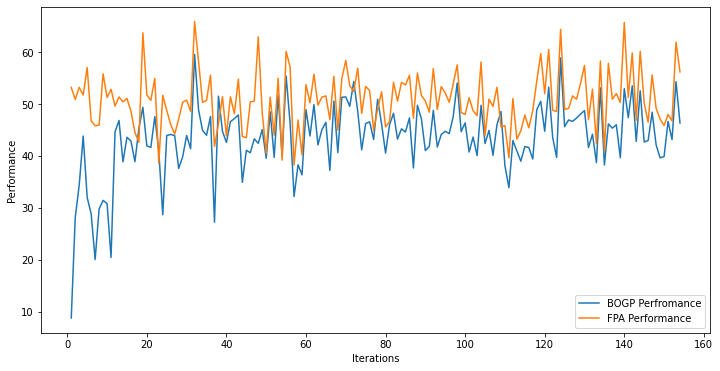

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.75278116  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.114563, actual=32.235
153


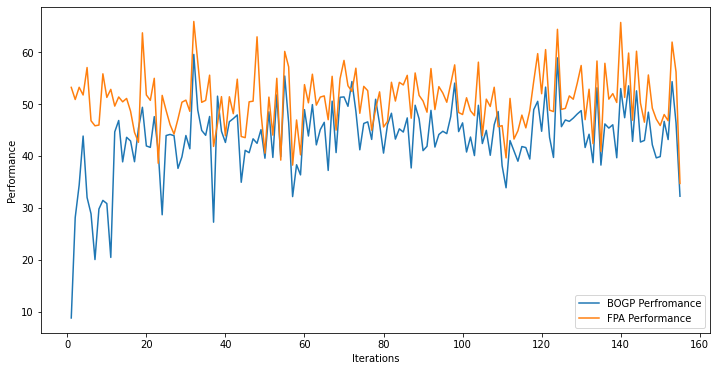

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.99918692  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.017037, actual=44.797
154


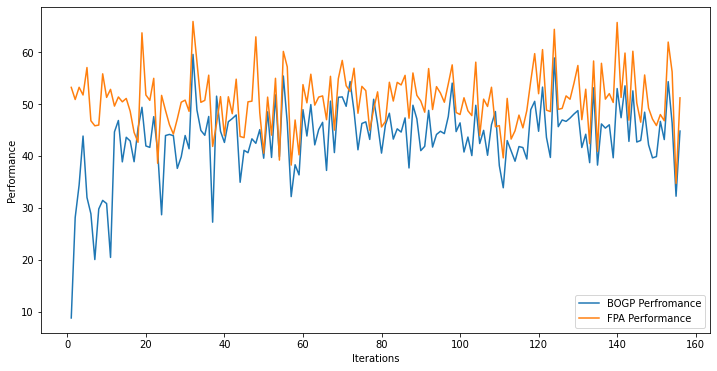

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.63270222  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.015444, actual=35.545
155


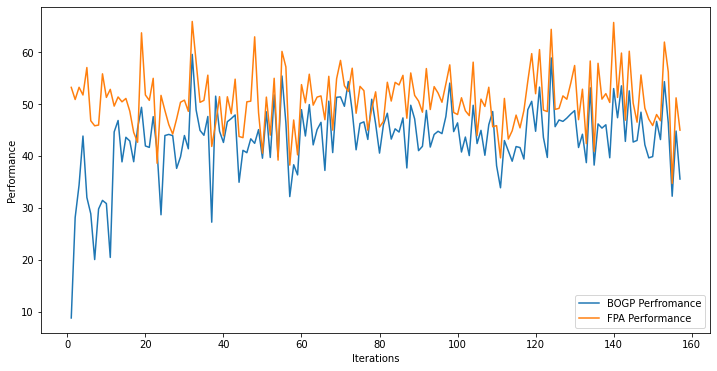

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.51605421  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.944015, actual=53.992
156


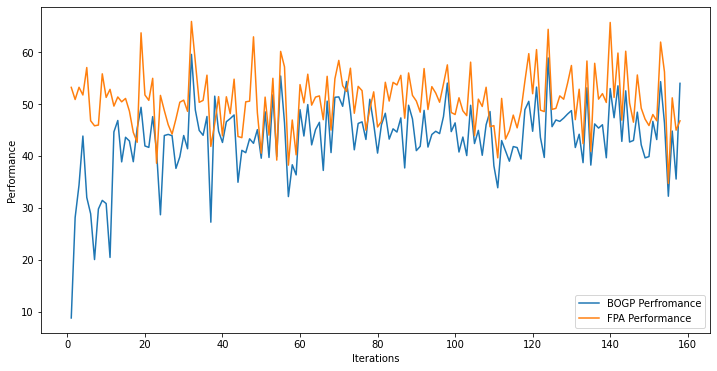

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.25169011  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.010247, actual=49.442
157


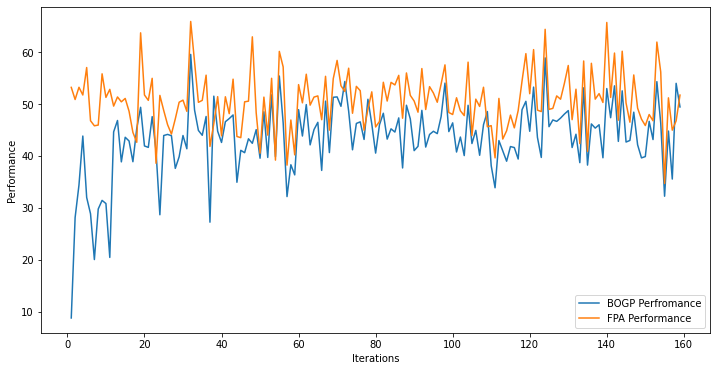

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -23.73335471  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.044409, actual=39.947
158


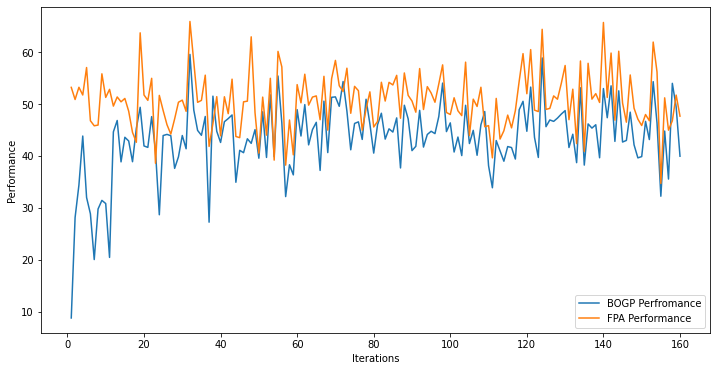

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.55447339  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.004914, actual=47.511
159


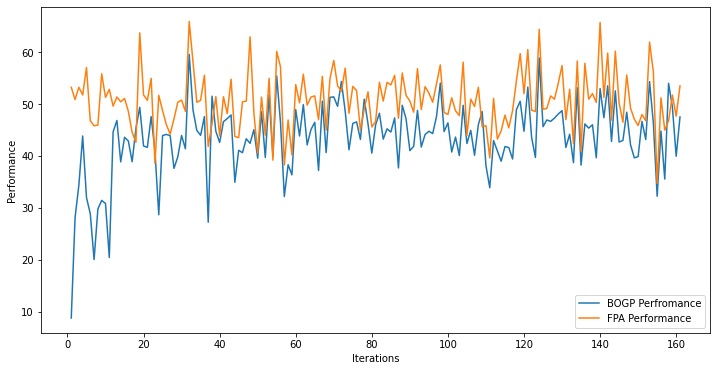

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.04130241  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.023336, actual=44.057
160


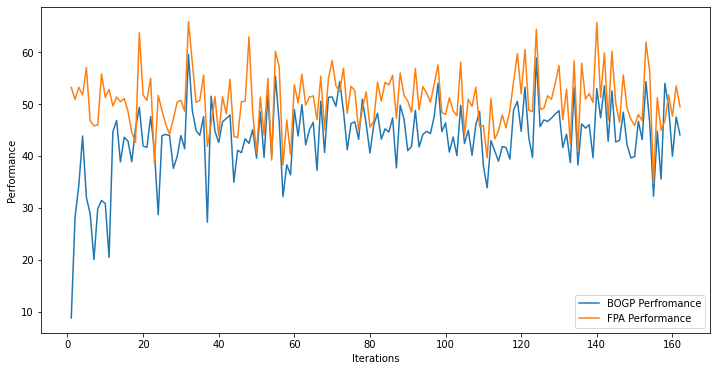

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.13031073  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.016716, actual=45.974
161


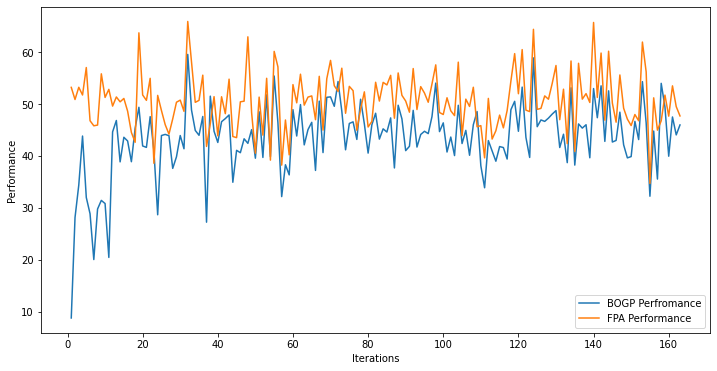

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.78613923  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.023987, actual=41.566
162


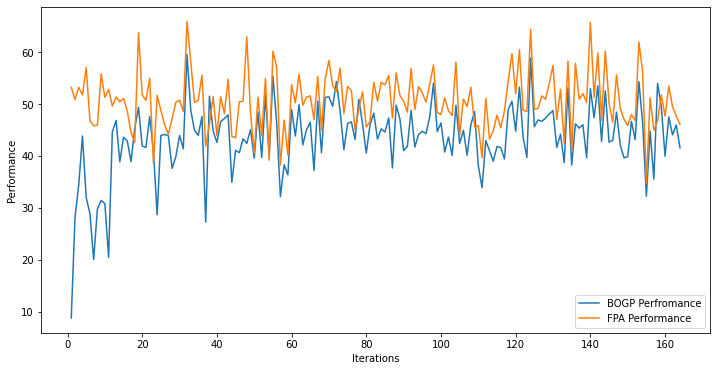

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.64389559  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=44.999457, actual=47.489
163


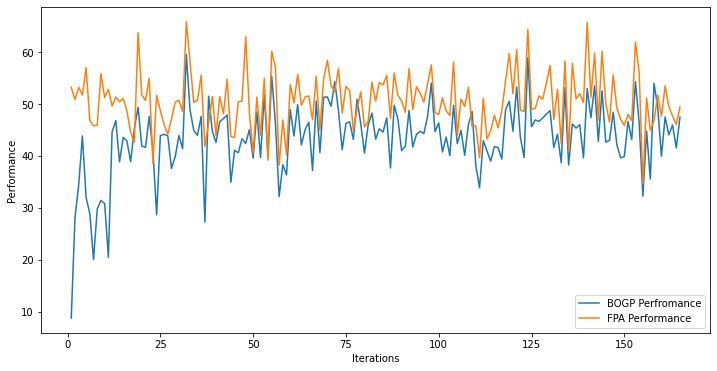

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.17906456  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.017205, actual=44.235
164


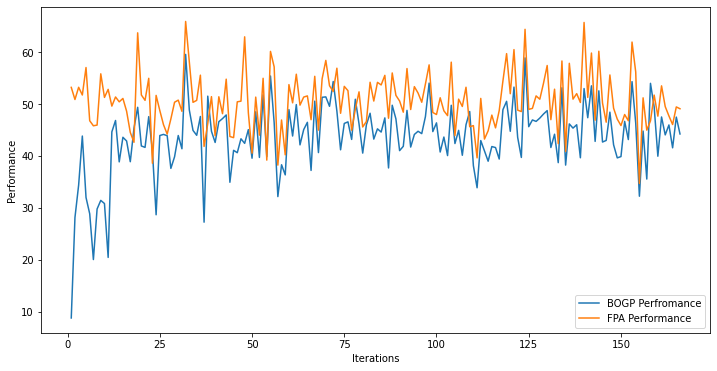

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.20879595  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.012069, actual=47.719
165


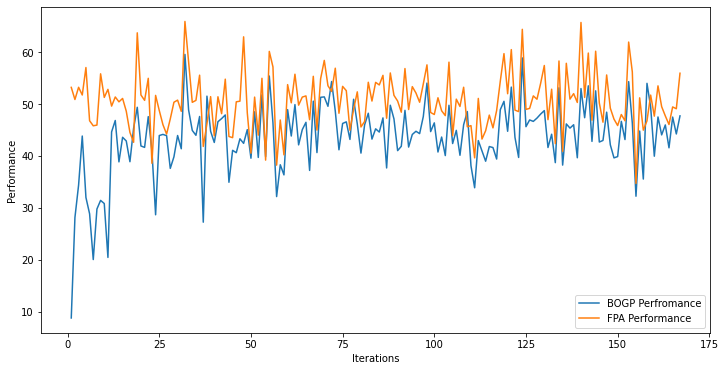

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.56900258  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.031277, actual=49.160
166


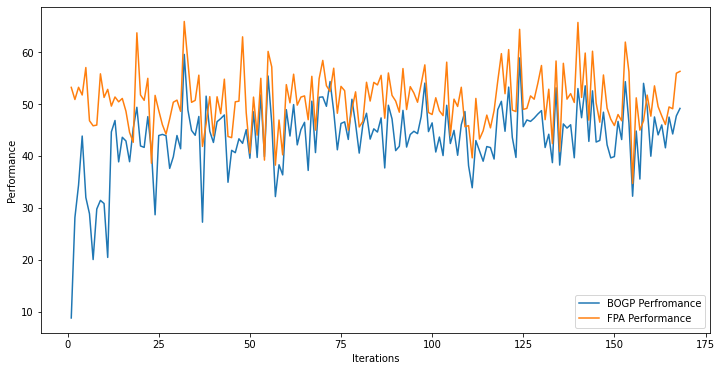

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -24.38094735  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.060790, actual=47.867
167


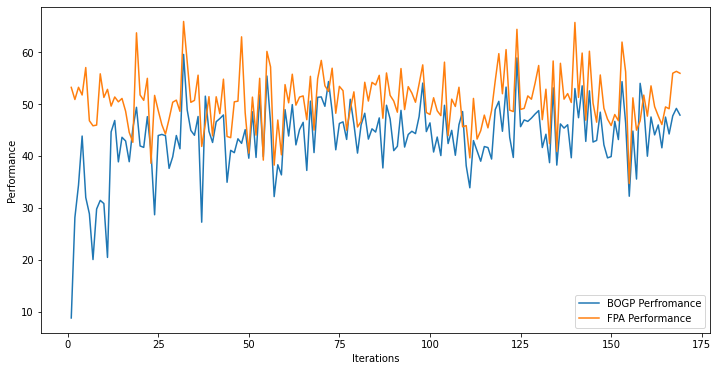

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -23.10628794  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.082054, actual=44.624
168


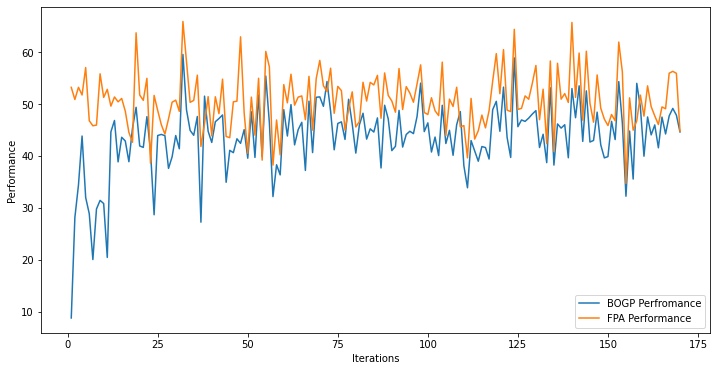

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -23.25133249  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.079001, actual=44.838
169


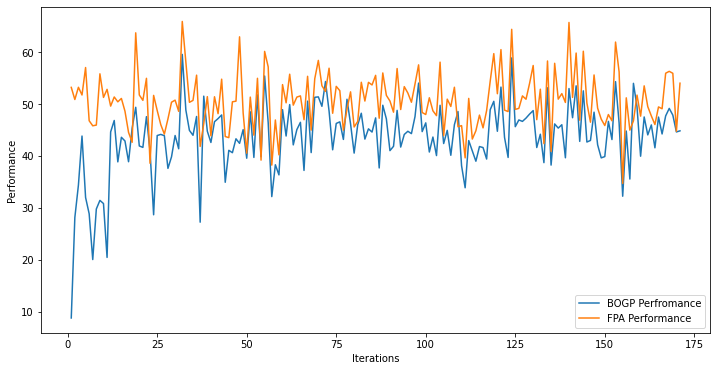

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -23.2643837  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.077658, actual=45.743
170


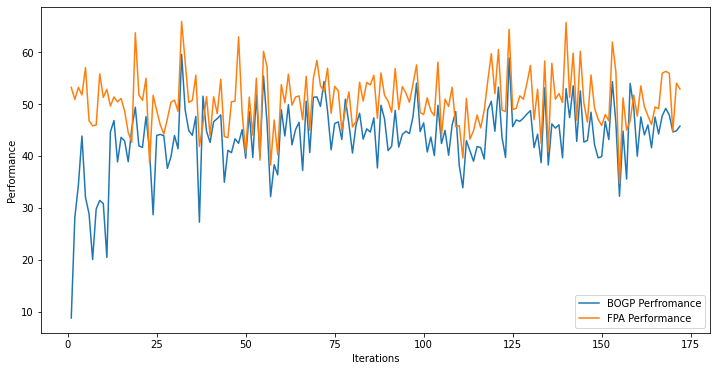

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -22.77685369  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.083293, actual=46.614
171


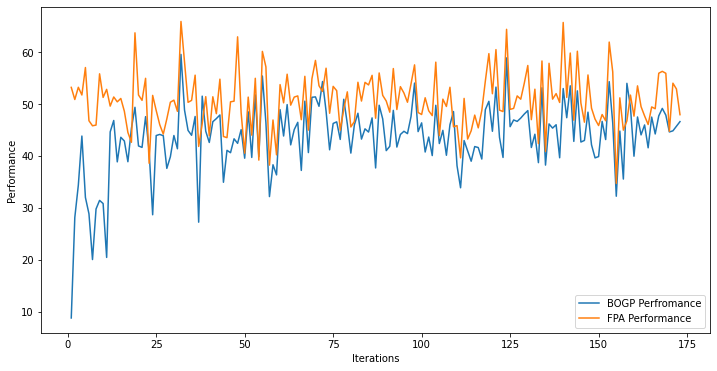

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -18.72843833  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.123390, actual=48.222
172


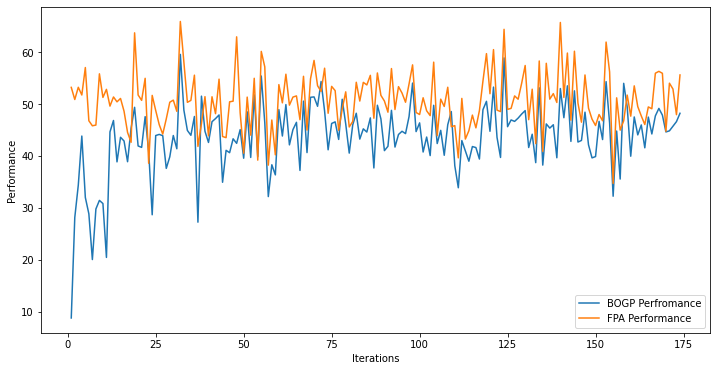

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -18.19680317  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.127926, actual=41.647
173


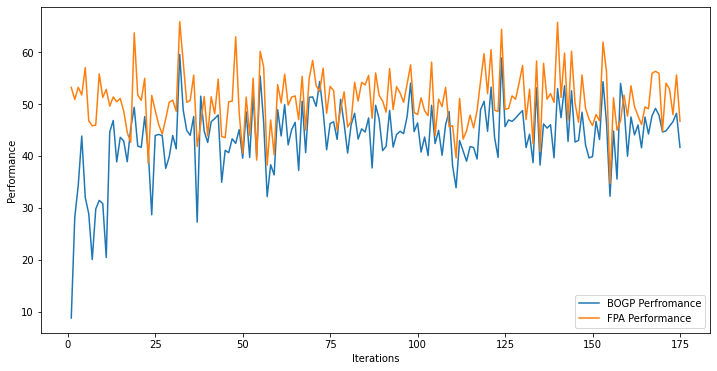

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -22.22133348  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.093122, actual=48.257
174


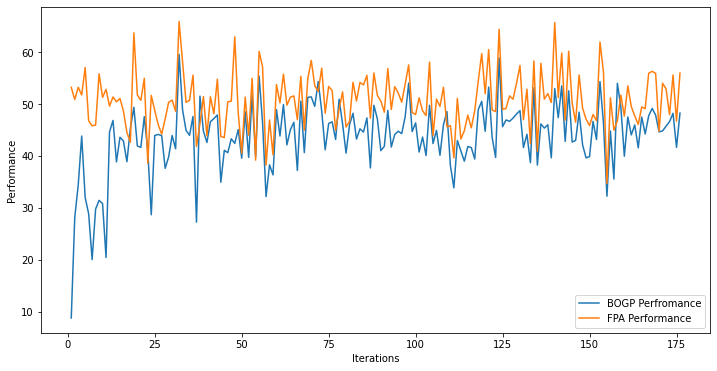

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -20.1270699  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.119462, actual=50.203
175


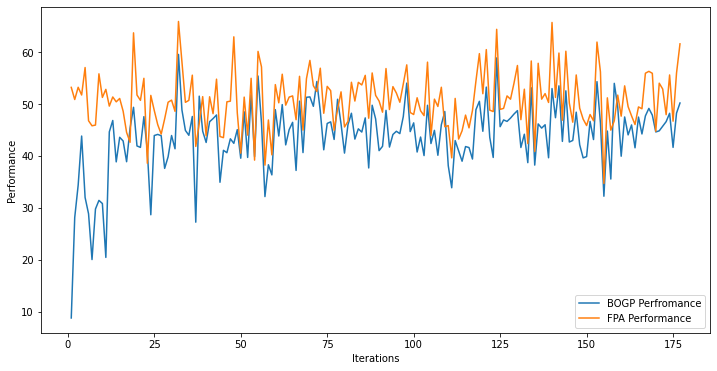

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -15.69239451  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.170730, actual=46.629
176


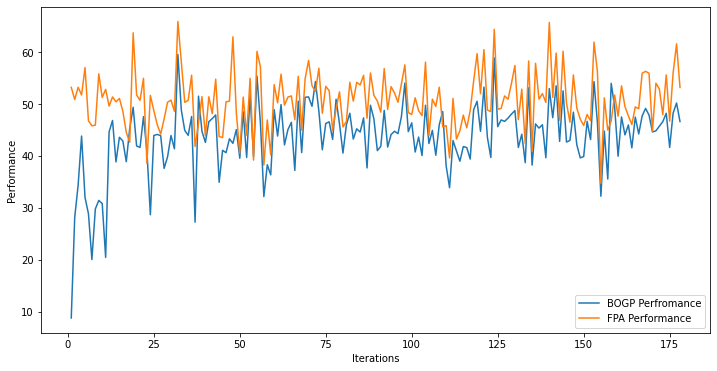

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -13.57514067  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.192196, actual=39.080
177


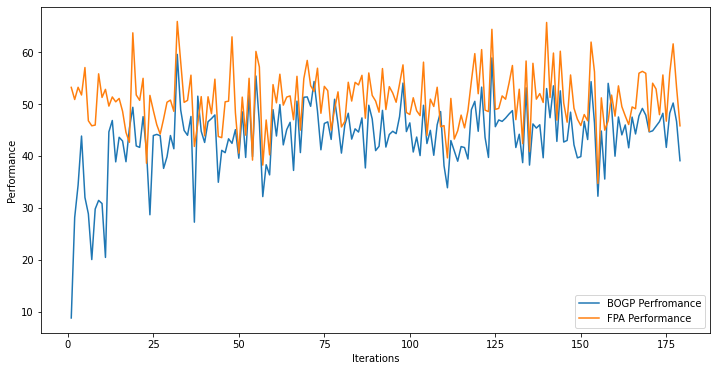

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -23.51995793  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.115658, actual=48.890
178


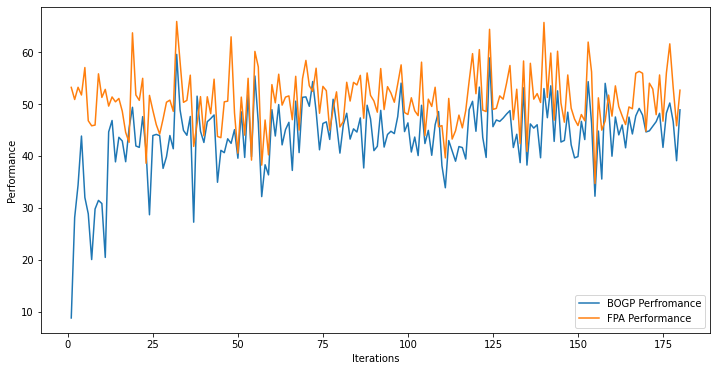

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -21.90511764  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.143000, actual=41.254
179


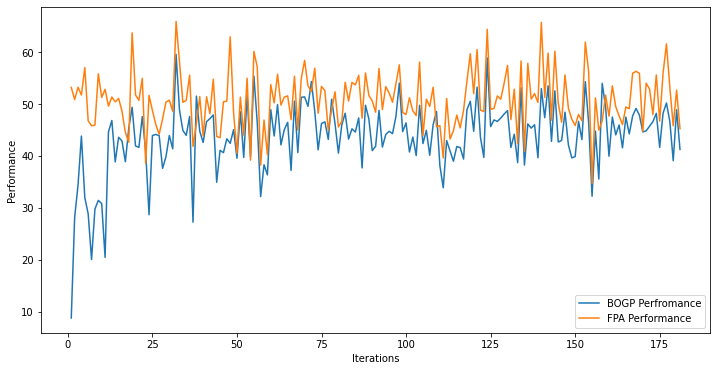

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -24.23381214  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.114305, actual=46.612
180


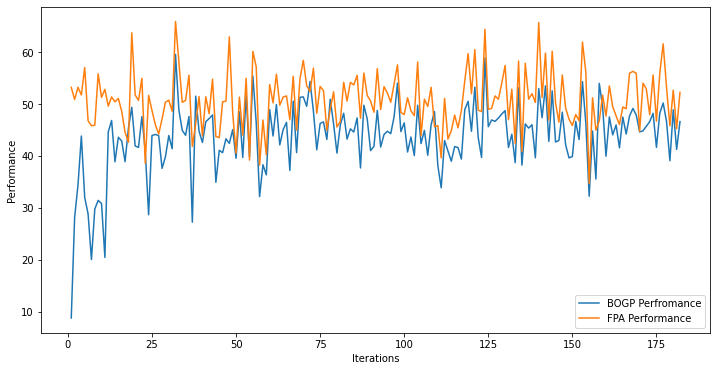

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -23.63801613  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.124768, actual=37.714
181


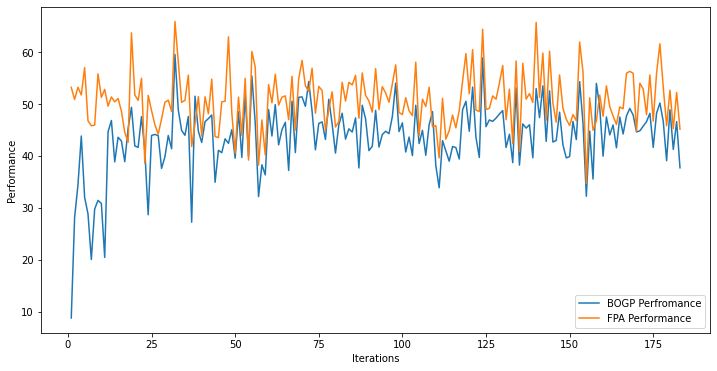

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.93179227  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.075835, actual=43.018
182


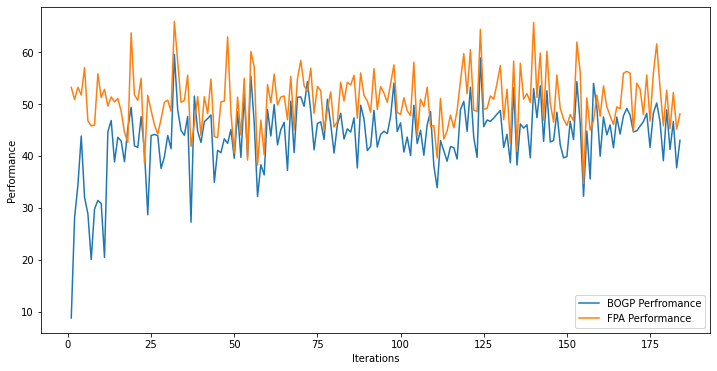

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -26.8770695  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.063373, actual=43.753
183


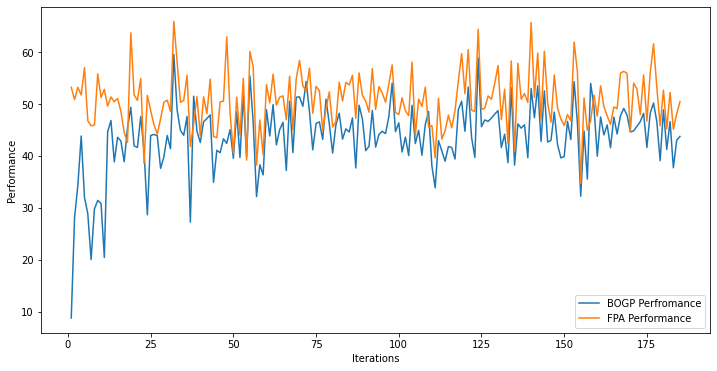

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.81134487  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.055577, actual=46.685
184


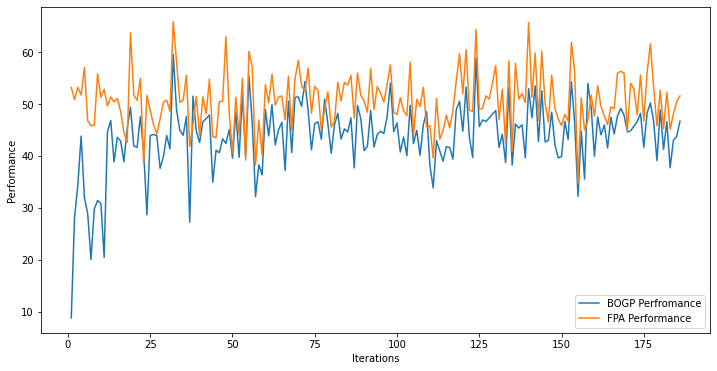

x_next is [ 40.         40.         40.         40.        -31.         40.
  40.         40.        -26.6527757  40.         40.         40.
  40.         40.         40.         40.         40.        -31.
  40.        -31.       ]
f()=45.065725, actual=49.275
185


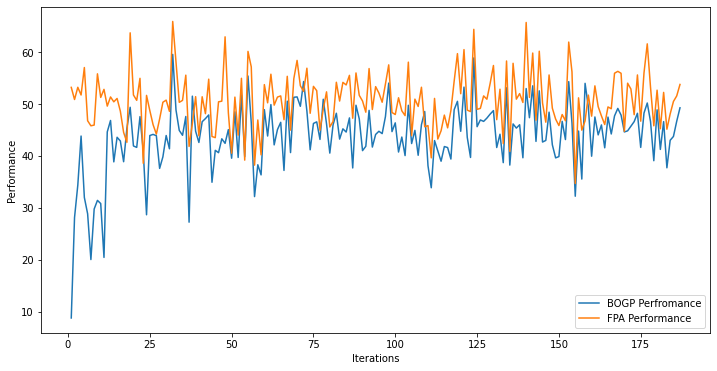

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.39713046  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.091297, actual=44.872
186


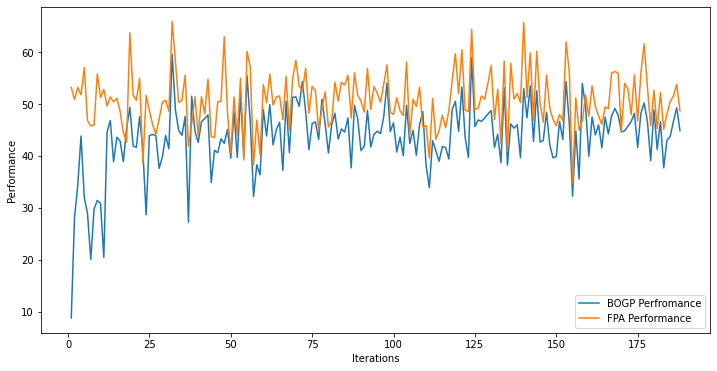

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.30747722  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.090243, actual=42.024
187


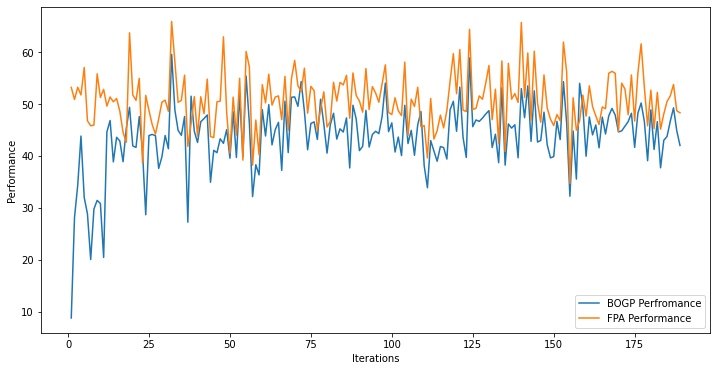

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.54575619  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.071980, actual=50.823
188


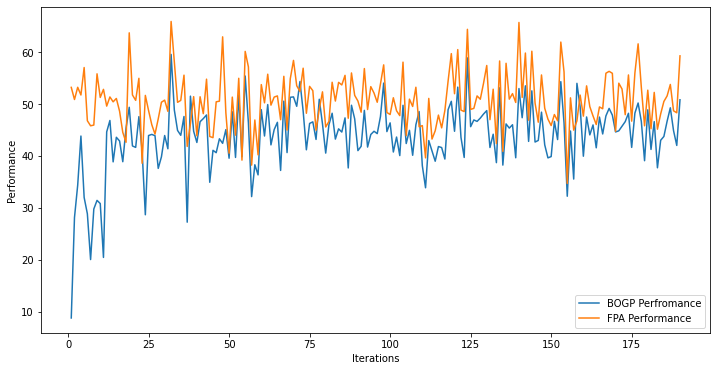

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.21406375  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.106150, actual=47.286
189


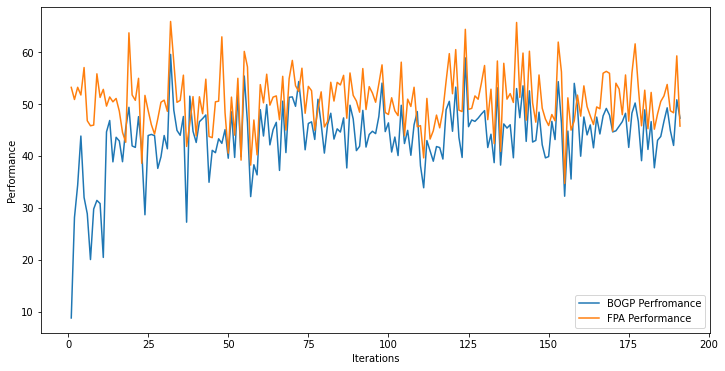

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.90219418  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.119359, actual=46.280
190


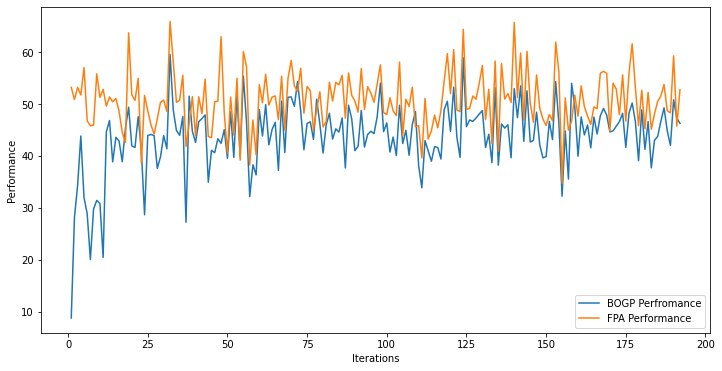

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.64354212  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.126548, actual=45.674
191


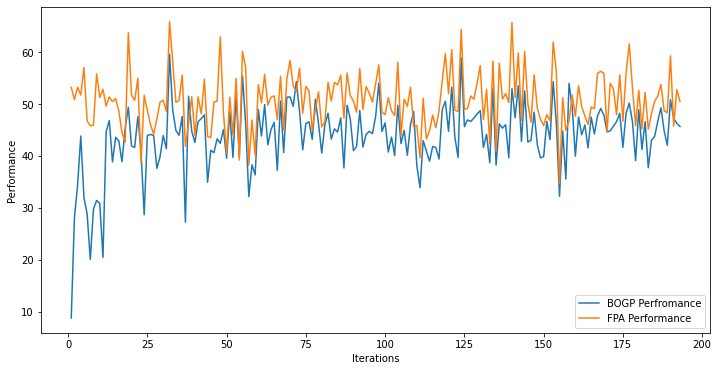

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -25.44817588  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.130119, actual=40.652
192


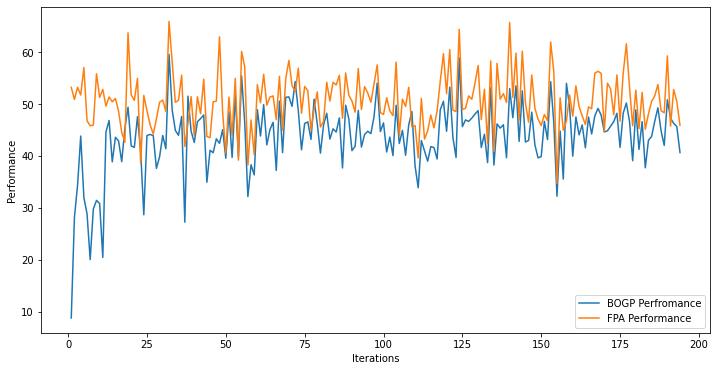

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -26.31617976  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.103663, actual=36.797
193


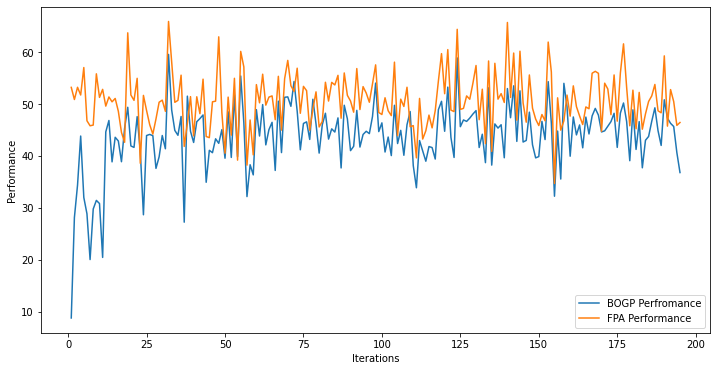

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -27.33561083  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.055171, actual=57.817
194


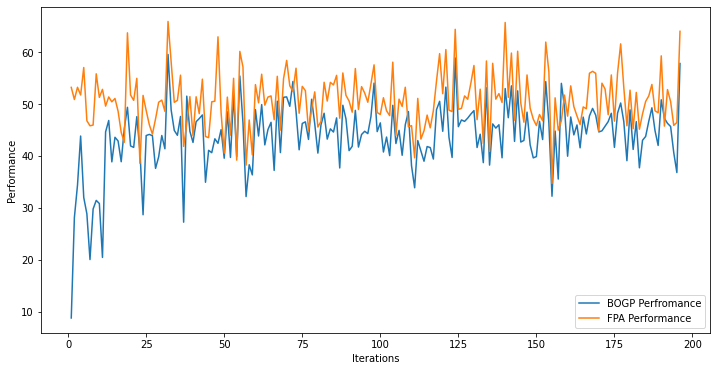

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.49722066  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.127463, actual=47.044
195


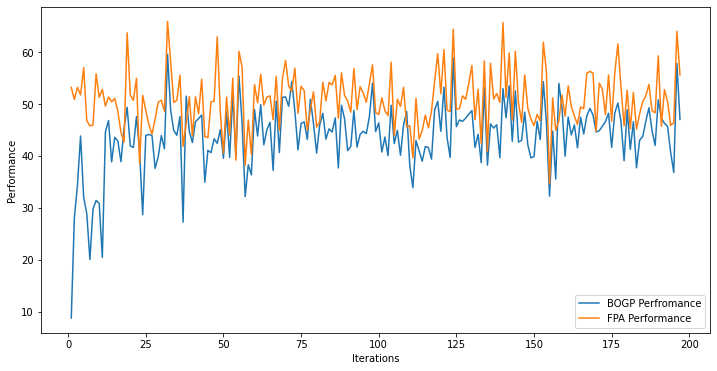

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -28.77984679  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.138750, actual=50.570
196


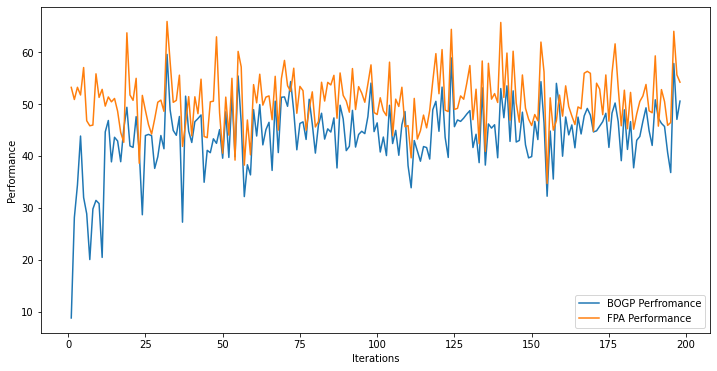

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.         -30.22605822  40.
  40.          40.          40.          40.          40.
  40.          40.         -31.          40.         -31.        ]
f()=45.170737, actual=54.365
197


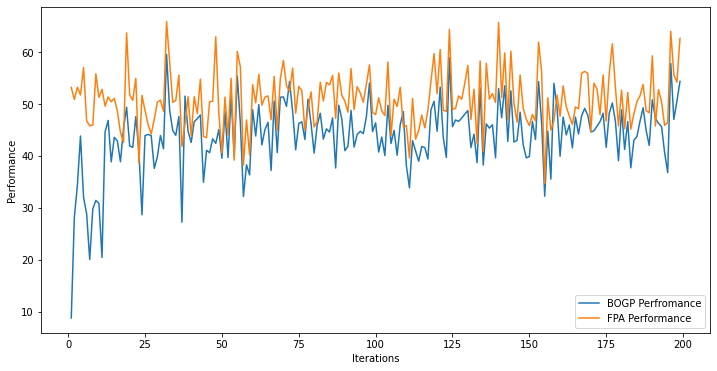

x_next is [ 38.26301009  36.82205572  22.53847796  27.4324525  -13.97884467
  34.65696922  39.21880114  36.28612291 -26.2267946   37.24326729
  38.5310511   37.06453731  34.312651    36.80694567  37.63691271
  39.10278057  32.61880787 -28.65684242  39.18595572 -30.94419626]
f()=43.915345, actual=41.651
198


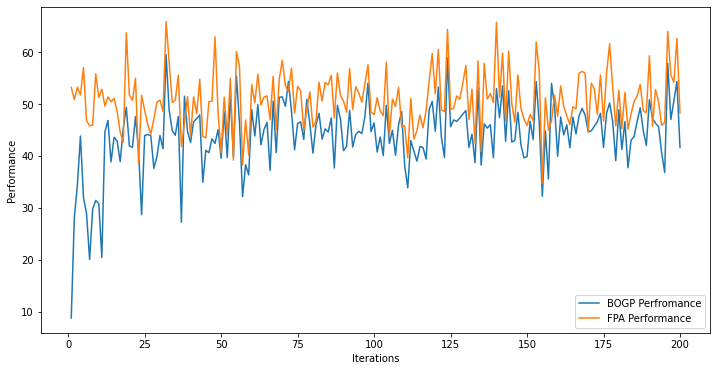

x_next is [ 40.  40.  40.  40. -31.  40.  40.  40. -31.  40.  40.  40.  40.  40.
  40.  40.  40. -31.  40. -31.]
f()=45.222932, actual=32.924
199


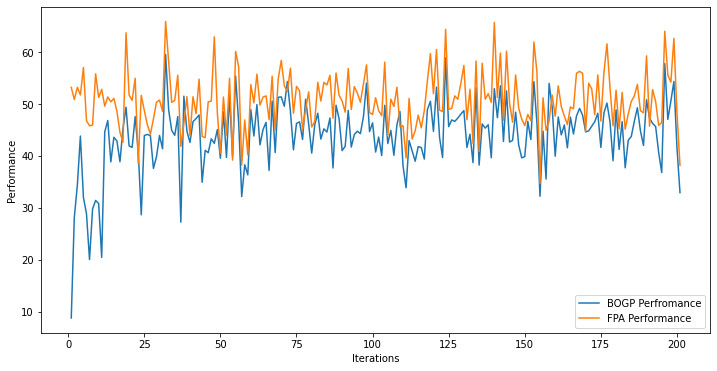

In [14]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_noisy_5.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_noisy_5.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_5.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


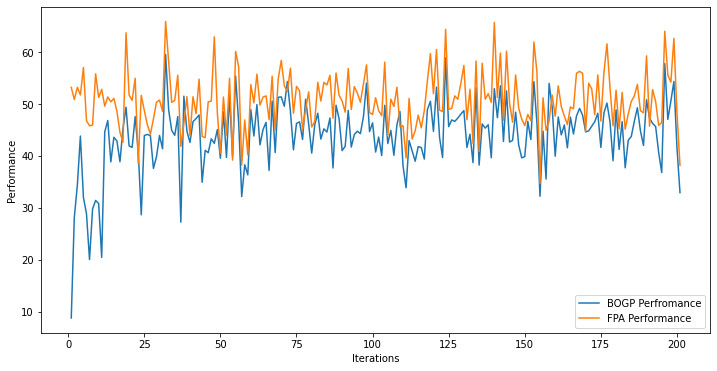

In [15]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 